# PART ONE    

## Question
    
    • CONTEXT: Medical research university X is undergoing a deep research on patients with certain conditions. University has an internal AI team. Due to confidentiality the patient’s details and the conditions are masked by the client by providing different datasets to the AI team for developing a AIML model which can predict the condition of the patient depending on the received test results.
    
    • DATA DESCRIPTION: The data consists of biomechanics features of the patients according to their current conditions. Each patient is represented in the data set by six biomechanics attributes derived from the shape and orientation of the condition to their body part.
    
        1. P_incidence
        2. P_tilt
        3. L_angle
        4. S_slope
        5. P_radius
        6. S_degree
        7. Class

## 1. Import and warehouse data:
**• Import all the given datasets and explore shape and size of each.**

**• Merge all datasets onto one and explore final shape and size.**

In [548]:
#Import Libraries
# To enable plotting graphs in Jupyter notebook
%matplotlib inline 
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB 
from sklearn.linear_model import LogisticRegression
from sklearn import svm
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from scipy.stats import zscore
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(color_codes=True) # adds a nice background to the graphs
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, accuracy_score, precision_score, recall_score
import os
from sklearn.preprocessing import LabelEncoder
from scipy import stats
%matplotlib inline
sns.set_style('darkgrid')
%matplotlib inline
from sklearn.preprocessing import MinMaxScaler
from sklearn import model_selection
import warnings
warnings.filterwarnings("ignore")
from collections import Counter
from sklearn.model_selection import cross_val_score
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTENC
from imblearn.over_sampling import SMOTE
# Confusion Matrix
from sklearn import metrics

**>> Import all the given datasets**

In [549]:
#Reading data for Part1 - Normal.csv
data_N = pd.read_csv("Part1 - Normal.csv")
#Reading data for Part1 - Type_H.csv
data_H = pd.read_csv("Part1 - Type_H.csv")
#Reading data for Part1 - Type_S.csv
data_S = pd.read_csv("Part1 - Type_S.csv")


**>> Explore shape and size of each**

In [550]:
print(f"Shape of Normal data : {data_N.shape}")
print(f"Shape of Type_H data : {data_H.shape}")
print(f"Shape of Type_S data : {data_S.shape}")
print(f"total rows: {data_N.shape[0] + data_H.shape[0] + data_S.shape[0]}")


Shape of Normal data : (100, 7)
Shape of Type_H data : (60, 7)
Shape of Type_S data : (150, 7)
total rows: 310


#### Shape and size of individual files    : 
    All the data have equal number of column. 
    Normal data has 100 row
    Type_H data has 60 row
    Type_S data has 150 row

**>> Check the first 5 column with head()**

In [551]:
data_N.head()

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree,Class
0,38.505273,16.964297,35.112814,21.540976,127.632875,7.986683,Normal
1,54.920858,18.968430,51.601455,35.952428,125.846646,2.001642,Normal
2,44.362490,8.945435,46.902096,35.417055,129.220682,4.994195,Normal
3,48.318931,17.452121,48.000000,30.866809,128.980308,-0.910941,Normal
4,45.701789,10.659859,42.577846,35.041929,130.178314,-3.388910,Normal


In [552]:
data_H.head()

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree,Class
0,63.027817,22.552586,39.609117,40.475232,98.672917,-0.254400,Type_H
1,39.056951,10.060991,25.015378,28.995960,114.405425,4.564259,Type_H
2,68.832021,22.218482,50.092194,46.613539,105.985135,-3.530317,Type_H
3,69.297008,24.652878,44.311238,44.644130,101.868495,11.211523,Type_H
4,49.712859,9.652075,28.317406,40.060784,108.168725,7.918501,Type_H


In [553]:
data_S.head()

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree,Class
0,74.377678,32.053104,78.772013,42.324573,143.560690,56.125906,Type_S
1,89.680567,32.704435,83.130732,56.976132,129.955476,92.027277,Type_S
2,44.529051,9.433234,52.000000,35.095817,134.711772,29.106575,Type_S
3,77.690577,21.380645,64.429442,56.309932,114.818751,26.931841,Type_S
4,76.147212,21.936186,82.961502,54.211027,123.932010,10.431972,Type_S


**>> Merge all datasets onto one**

In [554]:
# Merging all the files/data
data_merged = pd.concat([data_N, data_H, data_S])
data_merged.head()

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree,Class
0,38.505273,16.964297,35.112814,21.540976,127.632875,7.986683,Normal
1,54.920858,18.968430,51.601455,35.952428,125.846646,2.001642,Normal
2,44.362490,8.945435,46.902096,35.417055,129.220682,4.994195,Normal
3,48.318931,17.452121,48.000000,30.866809,128.980308,-0.910941,Normal
4,45.701789,10.659859,42.577846,35.041929,130.178314,-3.388910,Normal


**>> Explore final shape and size**

In [555]:
print(f"Shape of All data merged : {data_merged.shape}")

Shape of All data merged : (310, 7)


#### Overall the data has 310 columns and 7 rows

## 2. Data cleansing:
**• Explore and if required correct the datatypes of each attribute**

**• Explore for null values in the attributes and if required drop or impute values.**

**>>Explore data type**

In [556]:
data_merged.dtypes

P_incidence    float64
P_tilt         float64
L_angle        float64
S_slope        float64
P_radius       float64
S_Degree       float64
Class           object
dtype: object

**All the column except Class is float.**

**Since Class is categorical variable we can change the data type**

In [557]:
data_merged["Class"]=data_merged["Class"].astype('category')

**>> Explore for null values in the attributes**

In [558]:
data_merged.isnull().sum()

P_incidence    0
P_tilt         0
L_angle        0
S_slope        0
P_radius       0
S_Degree       0
Class          0
dtype: int64

**There is no null data present in the data**

**>> Get info on each category**

In [559]:
data_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 310 entries, 0 to 149
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   P_incidence  310 non-null    float64 
 1   P_tilt       310 non-null    float64 
 2   L_angle      310 non-null    float64 
 3   S_slope      310 non-null    float64 
 4   P_radius     310 non-null    float64 
 5   S_Degree     310 non-null    float64 
 6   Class        310 non-null    category
dtypes: category(1), float64(6)
memory usage: 17.5 KB


**>> Explore the categorical value and standardise the categories**

In [560]:
data_merged.Class.unique()

['Normal', 'Nrmal', 'Type_H', 'type_h', 'Type_S', 'tp_s']
Categories (6, object): ['Normal', 'Nrmal', 'Type_H', 'type_h', 'Type_S', 'tp_s']

In [561]:
data_merged.Class.value_counts()

Type_S    133
Normal     73
Type_H     37
Nrmal      27
type_h     23
tp_s       17
Name: Class, dtype: int64

**Here class are names are not standardised so changing the  Nrmal to Normal, type_h to Type_H and tp_s to Type_S.**

In [562]:
data_merged.replace('Nrmal','Normal',inplace=True)
data_merged.replace('type_h','Type_H',inplace=True)
data_merged.replace('tp_s','Type_S',inplace=True)

data_merged.Class.unique()

['Normal', 'Type_H', 'Type_S']
Categories (3, object): ['Normal', 'Type_H', 'Type_S']

In [563]:
data_merged.describe()

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree
count,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000
mean,60.496653,17.542822,51.930930,42.953831,117.920655,26.296694
std,17.236520,10.008330,18.554064,13.423102,13.317377,37.559027
min,26.147921,-6.554948,14.000000,13.366931,70.082575,-11.058179
25%,46.430294,10.667069,37.000000,33.347122,110.709196,1.603727
50%,58.691038,16.357689,49.562398,42.404912,118.268178,11.767934
75%,72.877696,22.120395,63.000000,52.695888,125.467674,41.287352
max,129.834041,49.431864,125.742385,121.429566,163.071041,418.543082


    1. All the columns have same data type except Class
    2. There are 310 samples.
    3. Since all the features are numeric and complete, there is no need for pre-processing such as converting data into numbers and filling in missing information.
    4. Since the value ranges of the features in the feature columns are very different from each other, scaling should be done. 

## 3. Data analysis & visualisation:
**• Perform detailed statistical analysis on the data.**

**• Perform a detailed univariate, bivariate and multivariate analysis with appropriate detailed comments after each analysis.**

### Statistical Analysis

In [564]:
data_merged.describe()

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree
count,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000
mean,60.496653,17.542822,51.930930,42.953831,117.920655,26.296694
std,17.236520,10.008330,18.554064,13.423102,13.317377,37.559027
min,26.147921,-6.554948,14.000000,13.366931,70.082575,-11.058179
25%,46.430294,10.667069,37.000000,33.347122,110.709196,1.603727
50%,58.691038,16.357689,49.562398,42.404912,118.268178,11.767934
75%,72.877696,22.120395,63.000000,52.695888,125.467674,41.287352
max,129.834041,49.431864,125.742385,121.429566,163.071041,418.543082


#### Statistical analysis
        1. P_incidence has 310 data, with mean as 60.497, standard deviation of 17.23, minimum value of 26.148 and max of 129.83. Median value is around 58.69. 
**Mean and median are almost same, hence this is normal data with very little skewness.**

        2. P_tilt has 310 data, with mean of 17.54, standard deviation of 10, min and max value of -6.555 and 49.43 respectively. Median value is around 16.358.
**Here mean and median have very little difference, hence this is normal data with very little skewness.**

        3. L_angle has 310 data, with mean as 51.93, standard deviation of 18.55, minimum value of 14 and max of 125.74. Median value is around 49.562
**Here mean and median have very little difference, hence this is normal data with very little skewness.**
        
        4. S_slope has 310 data, with mean of 42.95, standard deviation of 13.423, min and max value of 13.36 and 121.43 respectively. Median value is around 42.4
**Here mean and median have very little difference, hence this is normal data with very little skewness.**        

        5. P_radius has 310 data, with mean as 117.92, standard deviation of 13.317, minimum value of 70.1 and max of 163.1. Median value is around 118.27
**Here mean and median have very little difference, hence this is normal data with very little skewness.**
        
        6. S_Degree has 310 data, with mean of 26.297, standard deviation of 37.55, min and max value of -11.06 and 418.54 respectively. Median value is around 11.76
        
**Here mean and median have higher difference, The data seems to be skewed with few very high outliers(Max : 418.543082 and 75%: 41.29 )**

### Univariate Analysis

There is one property in the dataset that contains discrete values; class. The chart types we can use for the single discrete value distribution are; countplot(which is pandas bar graph) and percentage distribution.

<AxesSubplot:xlabel='Class', ylabel='count'>

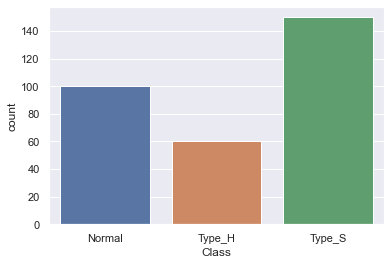

In [565]:
sns.countplot(x="Class",data= data_merged)

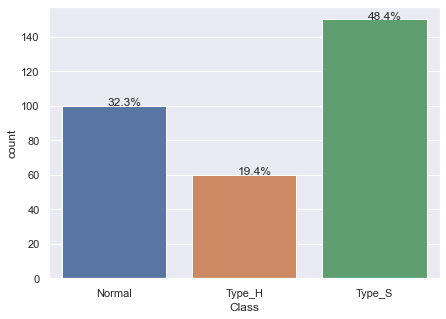

In [566]:
def percentage_mark(plot, feature):
    total = len(feature)
    for p in plot.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_y() + p.get_height()
        ax.annotate(percentage, (x, y), size = 12)
    plt.show()
    
plt.figure(figsize=(7,5))
ax=sns.countplot(x="Class",data= data_merged)

percentage_mark(ax, data_merged.Class)


    1. Above figure shows the distribution of count of class category
    2. Here we can observed that 48.4% of data is Type_S, 32.3% data is Normal class and 19.4% data is Type_H class

**Single Continuous Variable Distribution (Univariate Visualization)**


In [567]:
def continuous_univariate(dataset, continuos_feature):
    fig, ax=plt.subplots(nrows=1,ncols=3, figsize=(16,4))

    ax=ax.flatten()


    "Seaborn drawing functions in use"
    sns.distplot(a=dataset[continuos_feature], kde=False, ax=ax[0])
    sns.distplot(a=dataset[continuos_feature], hist=False, ax=ax[1])
    sns.distplot(a=dataset[continuos_feature], ax=ax[2]) 

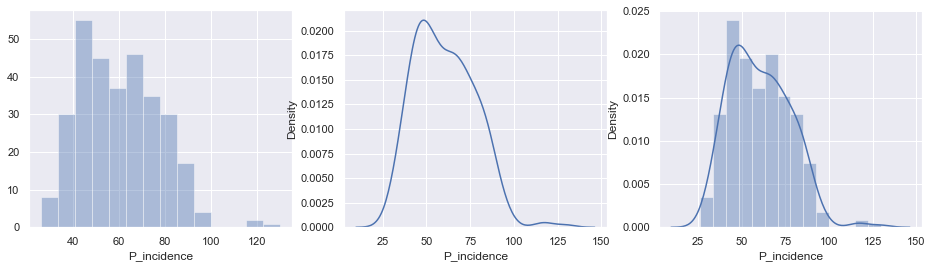

In [568]:
continuous_univariate(dataset=data_merged, continuos_feature="P_incidence")

**The distribution of the pelvic_incidence variable is close to the normal (Gaussian) distribution. The variable distribution is slightly more to the right of the mean. Most machine learning models do better on normally distributed datasets.**

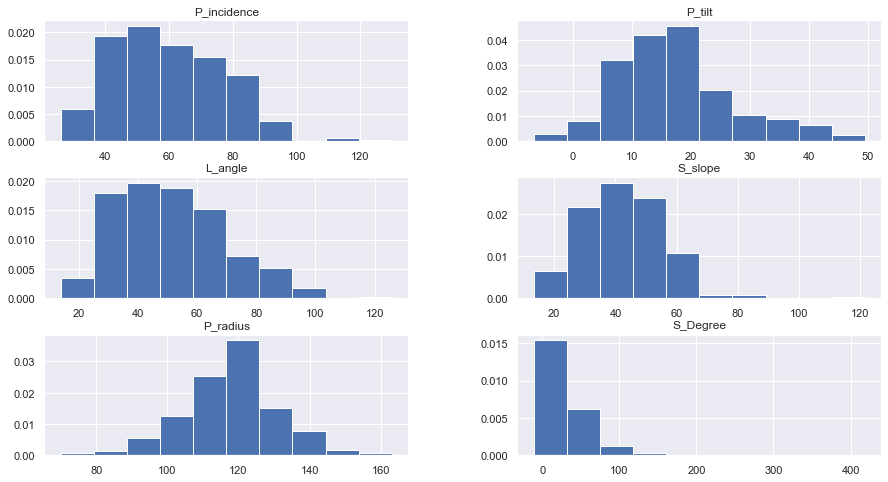

In [569]:
data_merged.hist(bins=10, density=True, figsize=(15,8))
plt.show()

**The data except S_Degree are normally distributed.S_Degree is skewed on right**

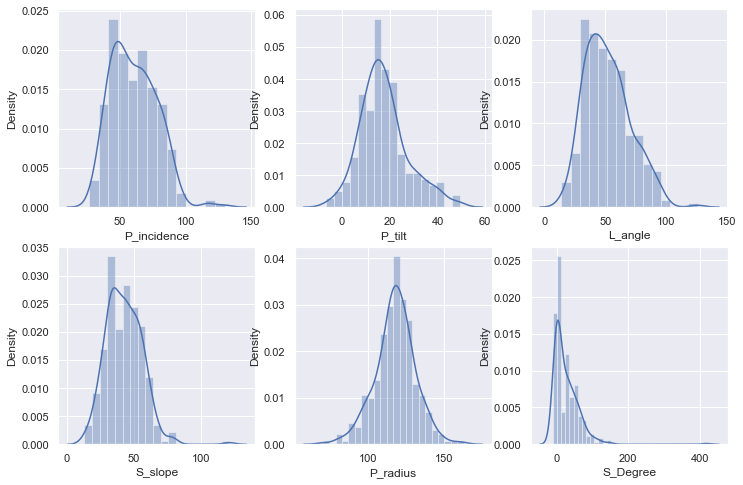

In [570]:
fig, ax=plt.subplots(nrows=2, ncols=3,figsize=(12,8))
ax=ax.flatten()
col_names=data_merged.drop('Class', axis=1).columns.values

for i,col_name in enumerate(col_names):
    sns.distplot(a=data_merged[col_name], ax=ax[i])

The table above shows the distribution of all continuous variables.

**The data except S_Degree are normally distributed.S_Degree is skewed on right**

### Bi Variate Analysis

In [571]:
def bivariate_boxplot_bargraph(data,criteria, criteria2):
    f,axes=plt.subplots(1,2,figsize=(17,7))
    sns.boxplot(x=criteria, y=criteria2, data= data, ax=axes[0])
    sns.barplot(x=criteria, y=criteria2, data= data, ax=axes[1])
    axes[0].set_title(f'{criteria} Variable Pie Chart with hue {criteria2}')
    axes[1].set_title(f'{criteria} Variable Bar Graph  with hue {criteria2}')
    plt.show()

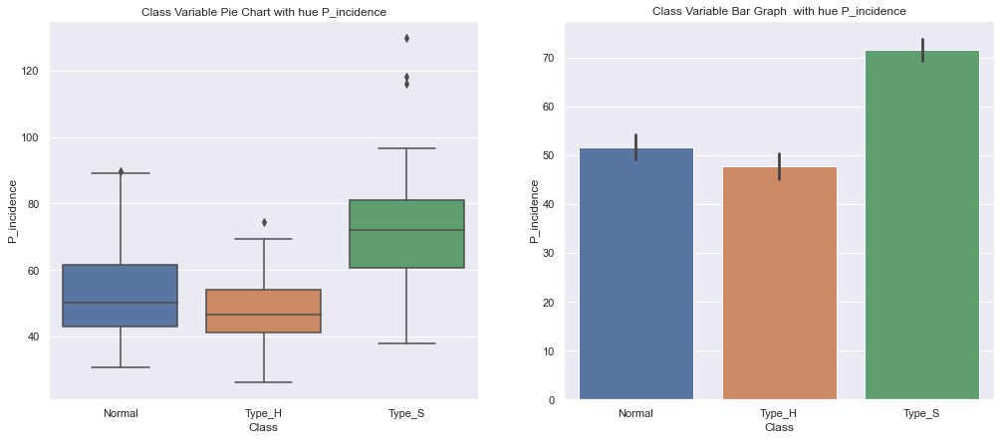

In [572]:
bivariate_boxplot_bargraph(data_merged, "Class", "P_incidence")

**P_incidence IQR is higher for Type_S class. Type_H and normal class have overlapping IQR of P_incidence**

**Mean of P_incidence for Type_S is highest and Type_H is lowest**

**There are few outliers in Type_S and Type_H class**

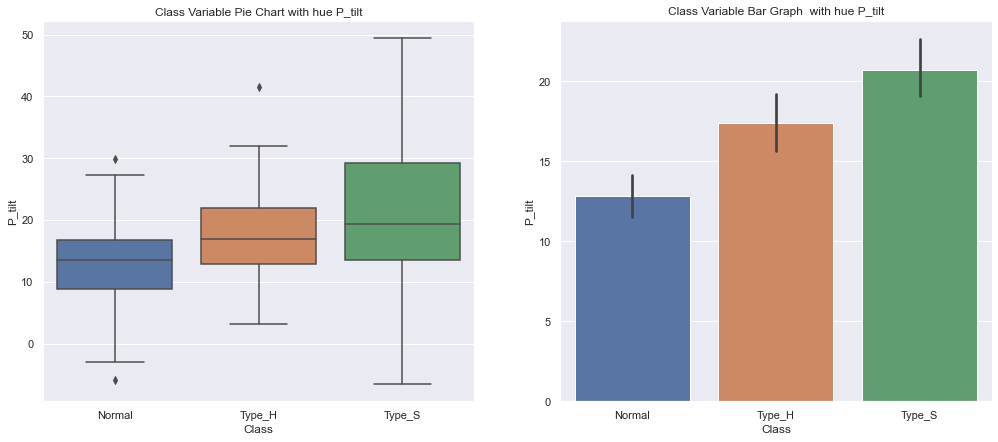

In [573]:
bivariate_boxplot_bargraph(data_merged, "Class", "P_tilt")

**IQR of p_tilt is overlapping for 3 classes**

**Mean of Type_S tilt is highest followed by Type_H and Normal**

**There are few outliers for normal and Type_H**

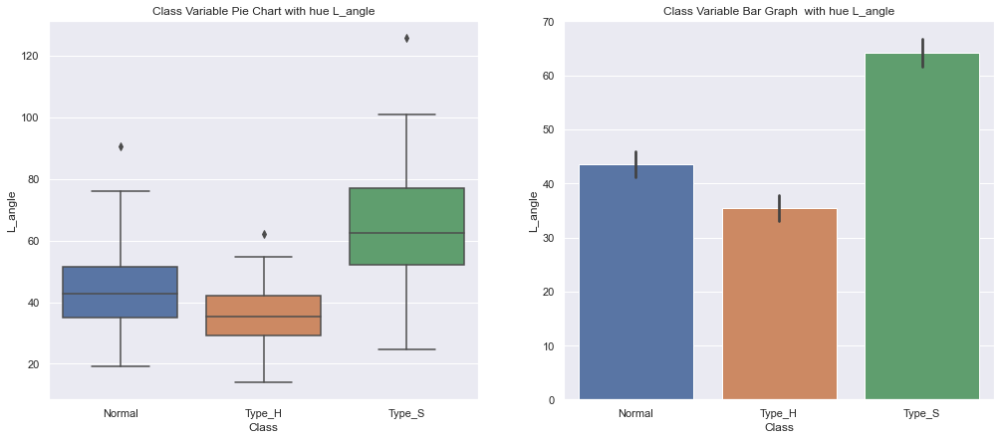

In [574]:
bivariate_boxplot_bargraph(data_merged, "Class", "L_angle")

**L_angle is quite similar distribution among classes as P_incidence**

**L_angle IQR is higher for Type_S class. Type_H and normal class have overlapping IOR of L_angle**

**Mean of L_angle for Type_S is highest and Type_H is lowest for Type_H**

**There are few outliers in Type_S, Normal and Type_H class**

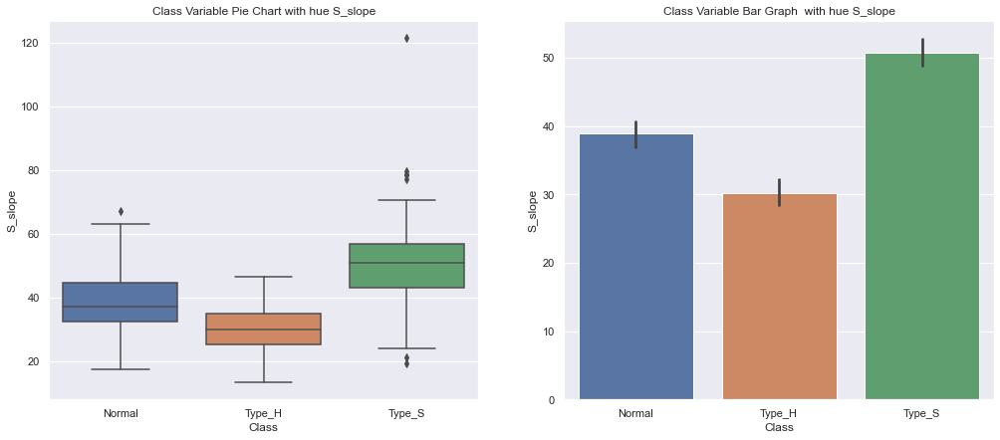

In [575]:
bivariate_boxplot_bargraph(data_merged, "Class", "S_slope")

**S_slope is quite similar distribution among classes as P_incidence and L_angle**

**S_slope IQR is higher for Type_S class. Type_H and normal class have overlapping IQR of S_slope**

**Mean of S_slope for Type_S is highest and Type_H is lowest for Type_H**

**There are few outliers in Type_S and Normal class**

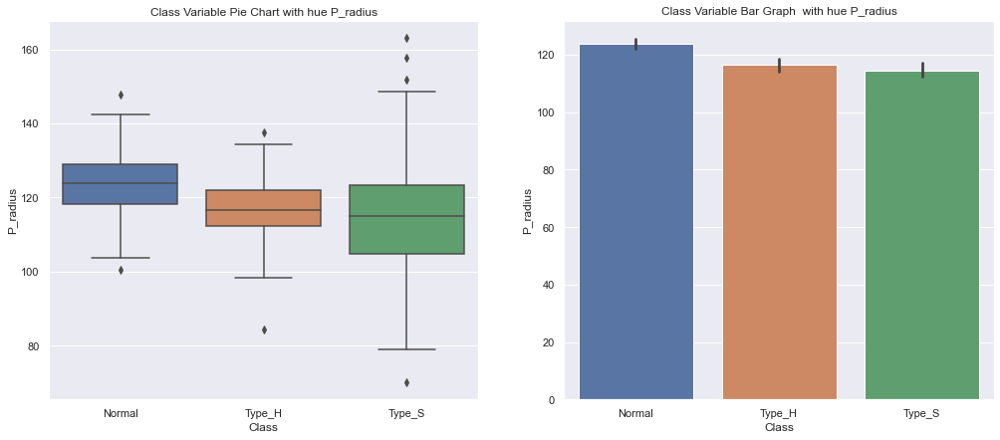

In [576]:
bivariate_boxplot_bargraph(data_merged, "Class", "P_radius")

**Mean P_radius is highest for Normal followed by Type_H and Type_S**

**There are few outlier for all the classes**

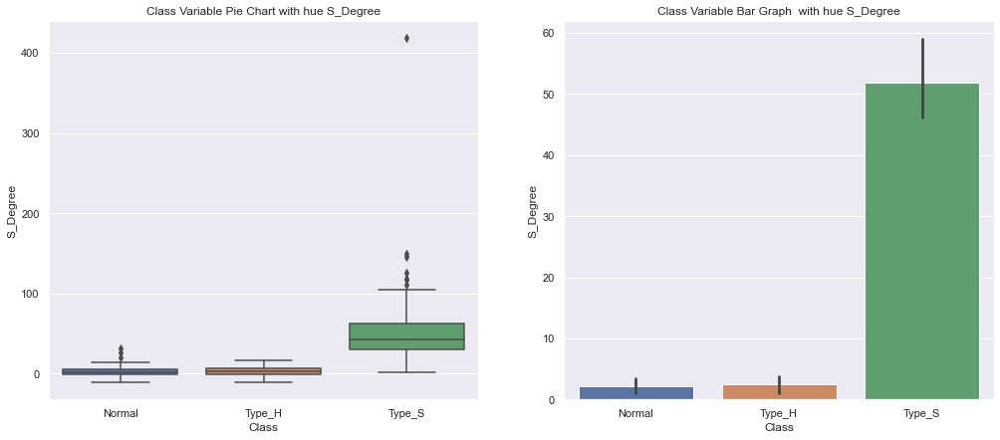

In [577]:
bivariate_boxplot_bargraph(data_merged, "Class", "S_Degree")

**There are lots of large outliers for Type_S class for S_Degree. Type_S has very large outliers**

**Mean of S_Degree for normal and type_H is very less compared to Type_S due to outliers**

**Showing the Relationship of the Features with Each Other**

    We can observe the relationship between all variables with pairplot and correlation matrix.
    
    Pairplot shows the relationships of all variables with each other with scatter graphs. If there is a linear relationship between two variables, removing one of these variables is likely to have a positive effect on the performance of the machine learning model.


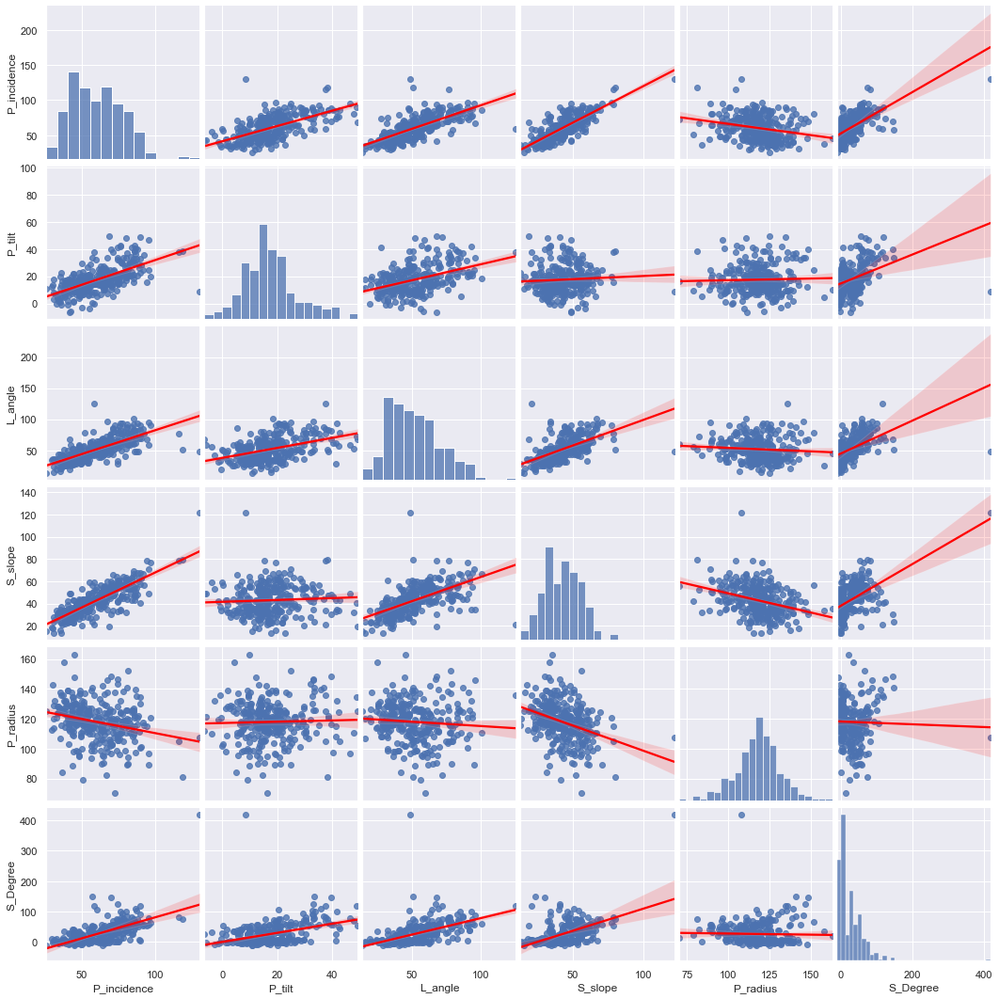

In [578]:
sns.pairplot(data_merged,kind="reg", plot_kws={'line_kws':{'color':'red'}})

**Correlation matrix determines the direction and strength of the relationship between variables . 
It presents the relationship presented by the piarplot plot with more clear and numerical values. 
The correlation matrix is ​​the best chart type for interpreting the data set as a whole.**

In [579]:
corr=data_merged.corr()

<AxesSubplot:>

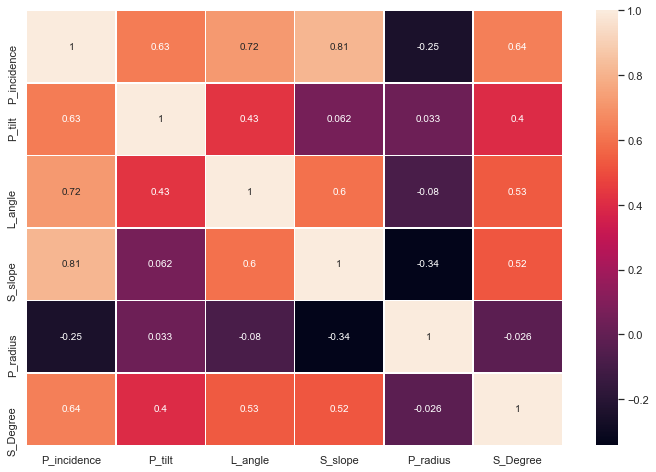

In [580]:
fig, ax=plt.subplots(1,1,figsize=(12,8))
sns.heatmap(corr,annot=True, linewidth=.5, ax=ax)

**There is high correlation between P_incidence vs L_angle and P_incidence vs S_slope. Correlation between L_angle and S_slope is 0.6 which nominal**


In [581]:
def plot_categorical(dataset, categorical_feature, rows, cols):
    fig, axarr=plt.subplots(nrows=2,ncols=4, figsize=(15,10))
    features=dataset.columns.values[:-1]
    
    counter=0
    #sns.countplot(x=categorical_feature, data=dataset, ax=axarr[0,0])
    dataset['Class'].value_counts().plot.bar(ax=axarr[0,0])
    dataset['Class'].value_counts().plot.pie(autopct="%1.1f%%",ax=axarr[0,1])
    for i in range(rows):
        for j in range(cols):
            feature=features[counter]
            if (i==0 and j==0) or (i==0 and j==1):
                continue
            else:
                sns.swarmplot(x=categorical_feature,y=feature,
                             
                            data=dataset, 
                            ax=axarr[i, j])
            counter=counter+1
            if counter>=len(features):
                break
    
    plt.tight_layout()
    plt.show()

**Class Distributions and Distribution of Property Values ​​Over Classes**
    
    'Class' variable is a discrete value, the drawing types used in the visualization of categorical data will be preferred. The plot types used for categorical values ​​in the Seaborn library are: stripplot(), swarmplot(), boxplot(), violinplot(), boxenplot() pointplot(), barplot(), countplot().
    
    First, let's use the countplot() chart type to learn the class distributions. Next, let's show the relationship between the output variable and each input variable with swarmplot


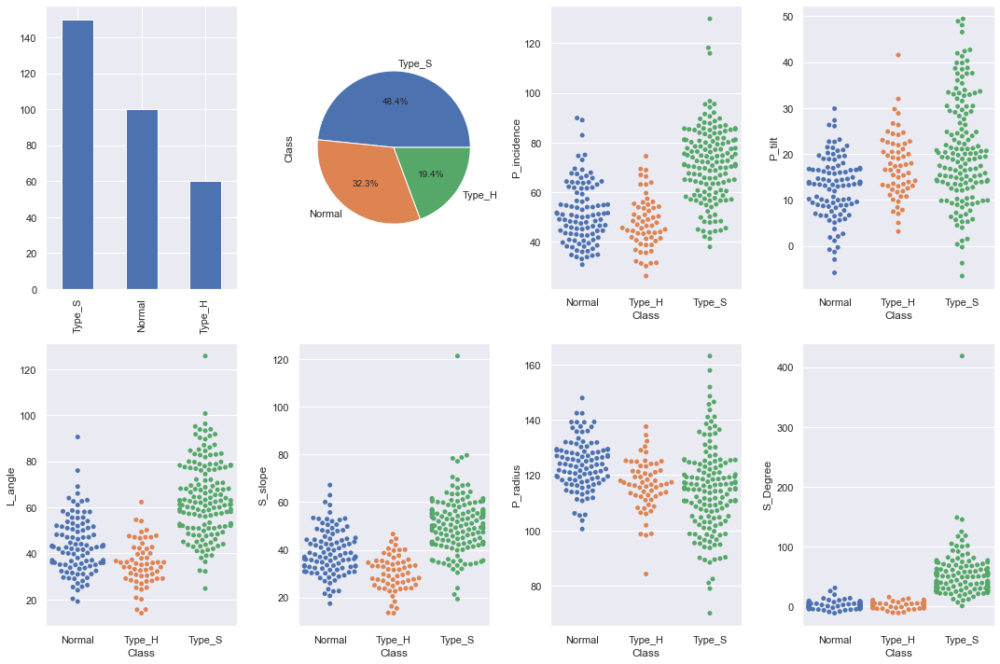

In [582]:
plot_categorical(dataset=data_merged, categorical_feature="Class", rows=2, cols=4)

### Multivariate Analysis

**Helper Function: draw_multivarient_plot**

    1. interpret the relations of the properties in the dataset with the class;
    2. Violin Graphics (Violin Plot)
    3. Box Graph (Box Plot)
    4. Point Chart (Point Plot)
    5. Bar Graph (Bar plotters) 


In [583]:
#Helper Function: draw_multivarient_plot(dataset, rows, cols, plot_type)

def draw_multivarient_plot(dataset, rows, cols, plot_type):
    
    assert plot_type in ['violin', "box", "point", "bar"],"We dont have such as plot type:{}".format(plot_type)
    column_names=dataset.columns.values
    number_of_column=len(column_names)
    fig, axarr=plt.subplots(rows,cols, figsize=(22,16))
    
    counter=0
    for i in range(rows):
        for j in range(cols):
            if 'violin' in plot_type:
                sns.violinplot(x='Class', y=column_names[counter],data=dataset, ax=axarr[i][j])
            elif 'box'in plot_type :
                sns.boxplot(x='Class', y=column_names[counter],data=dataset, ax=axarr[i][j])
            elif 'point' in plot_type:
                sns.pointplot(x='Class',y=column_names[counter],data=dataset, ax=axarr[i][j])
            elif 'bar' in plot_type:
                sns.barplot(x='Class',y=column_names[counter],data=dataset, ax=axarr[i][j])
                
            counter+=1
            if counter==(number_of_column-1,):
                break

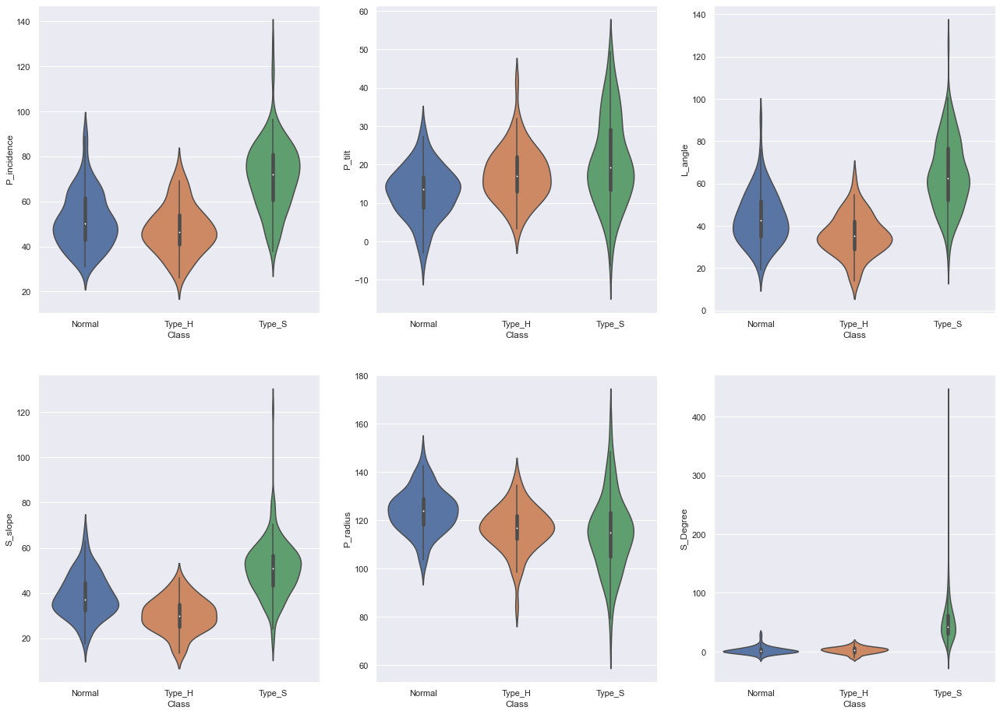

In [584]:
draw_multivarient_plot(dataset=data_merged, rows=2, cols=3,plot_type="violin")

**Here we can see that distribution of the different variable against Class(Categorical Variable)**

**Except S_Degree, the distribution is pretty much normal.**

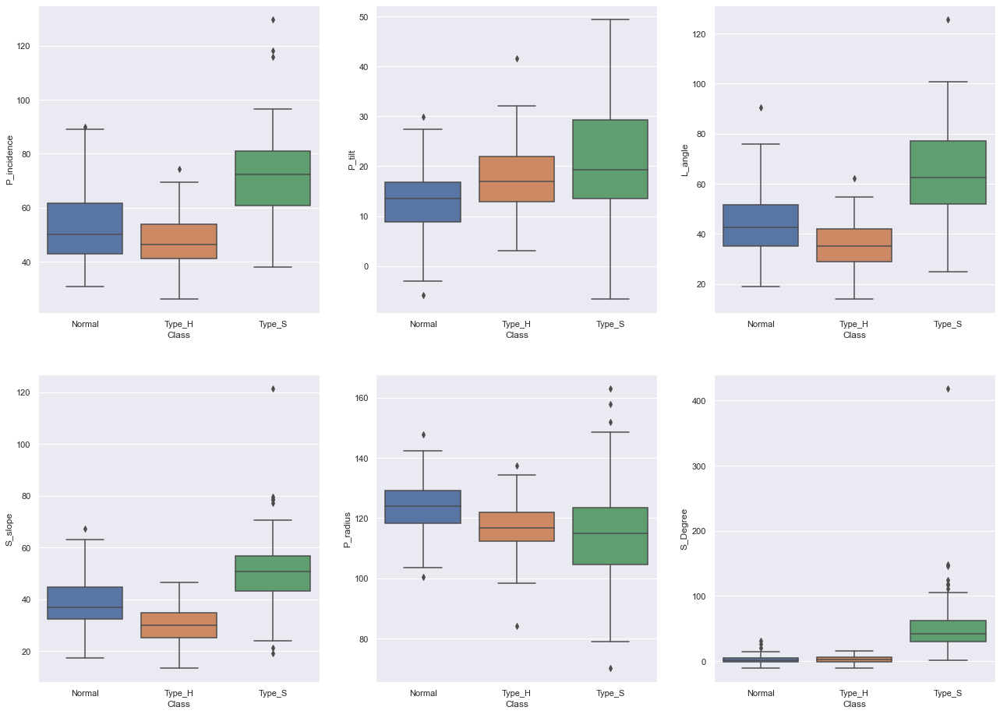

In [585]:
draw_multivarient_plot(dataset=data_merged, rows=2, cols=3,plot_type="box")

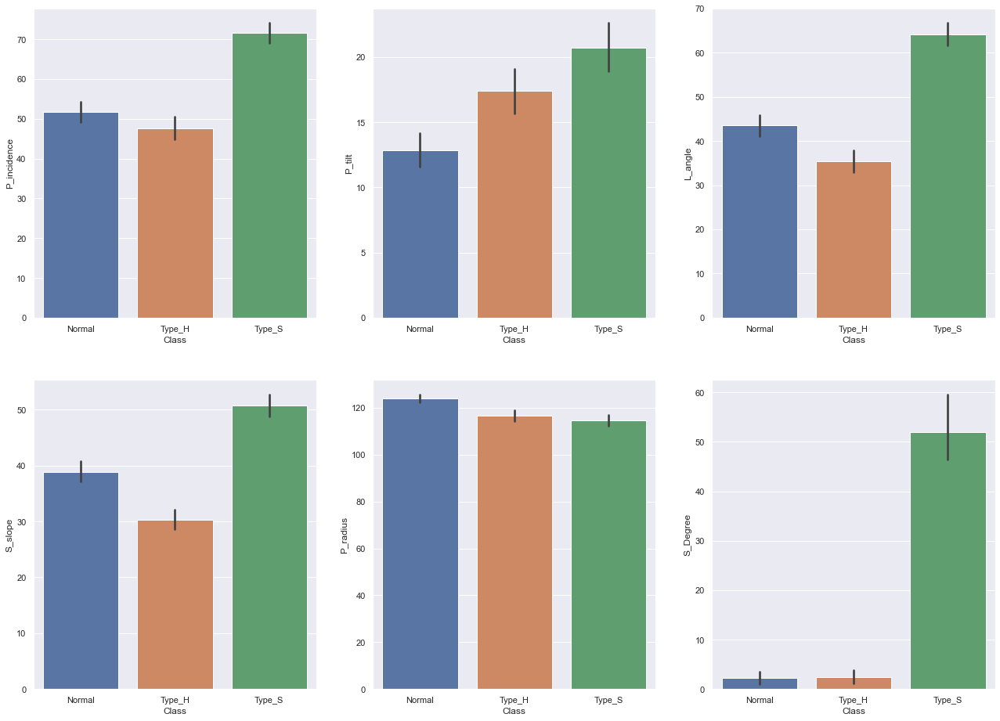

In [586]:
draw_multivarient_plot(dataset=data_merged, rows=2, cols=3,plot_type="bar")

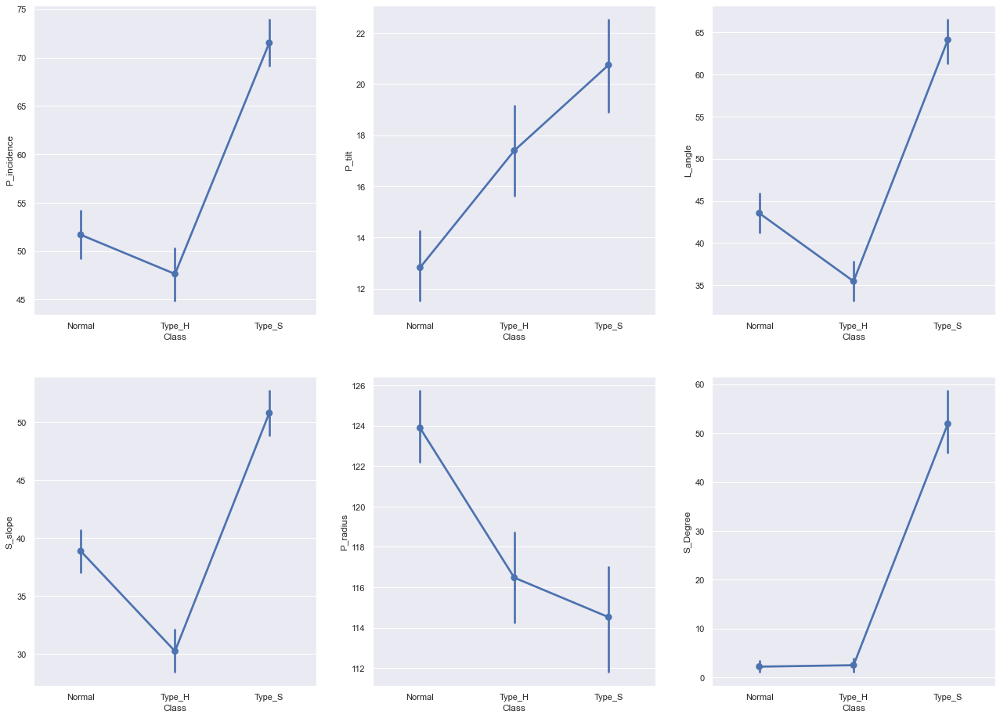

In [587]:
draw_multivarient_plot(dataset=data_merged, rows=2, cols=3,plot_type="point")

**Here we can see the mean for distribution for different class type**

### With respect to mean :

**P_incidence : Type_S has maximum P_incidence and Type_H has minimum P_incidence.**

**P_tilt : Type_S again has maximum P_tilt and Normal has minimum P_tilt**

**L_angle : Type_S has maximum L_angle and Type_H has minimum L_angle.**

**S_slope : Type_S has maximum S_slope and Type_H has minimum S_slope.**

**P_radius : normal has maximum P_radius and Type_S has minimum P_radius.**

**S_Degree : normal and Type_H has almost equal S_Degree mean but Type_S has highest mean.**



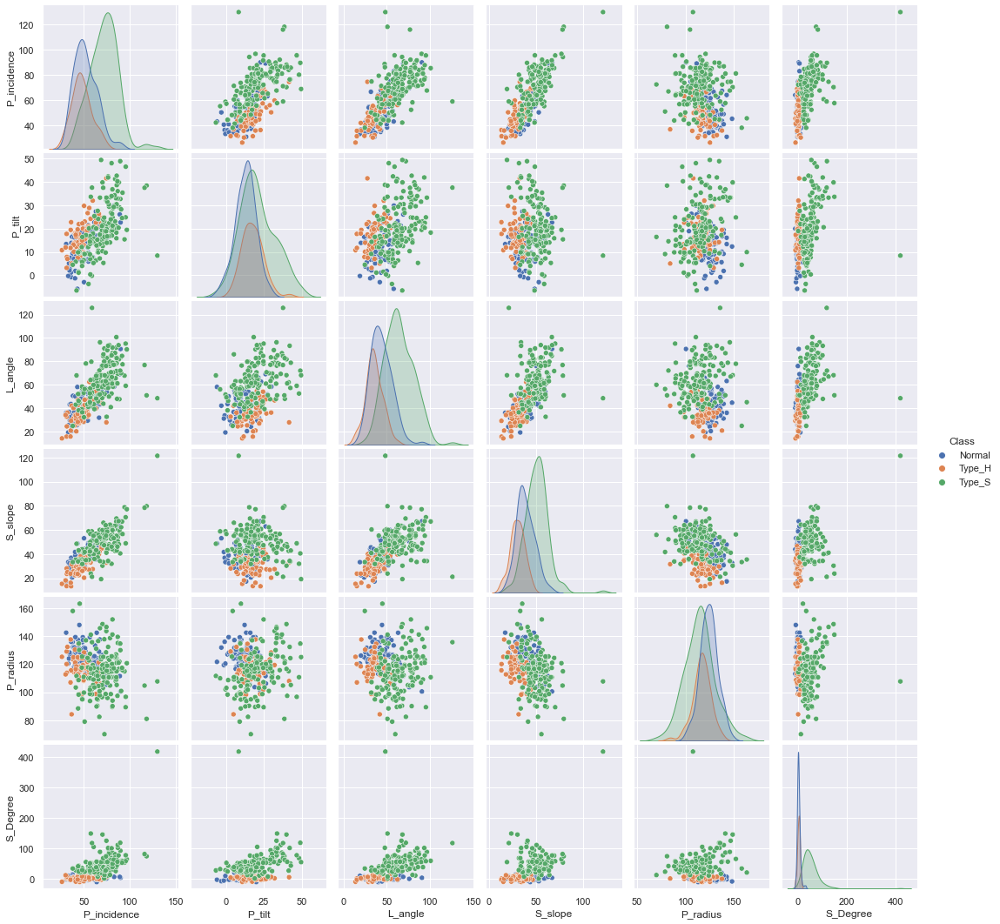

In [588]:
sns.pairplot(data_merged, hue="Class")

**There is linear relation between P_incidence vs L_angle and P_incidence vs S_slope.** 

**There is nominal linearity between L_angle and S_slope**

**We can compare the result and remove the highly related data after hypothesis testing.**



### Hypothesis Testing
**We can check whether all the independent variables has significant effect on target variables**

In [589]:
data_summary=data_merged.groupby('Class') #getting mean values of each class for all independent variables
data_summary.mean().reset_index()

,Class,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree
0,Normal,51.685244,12.821414,43.542605,38.863830,123.890834,2.186572
1,Type_H,47.638407,17.398795,35.463524,30.239612,116.474968,2.480251
2,Type_S,71.514224,20.748038,64.110108,50.766186,114.518810,51.896687


There is huge difference in S_Degree for Type_S class

**Hypothesis Testing of continuous feature with target variable**

In [590]:
col=list(data_merged.select_dtypes(include=['int64','float64']).columns)
col

['P_incidence', 'P_tilt', 'L_angle', 'S_slope', 'P_radius', 'S_Degree']

Here we will be using two-sample unpaired t-test

Ho(Null Hypothesis):There is no significant difference in independent feature with different category of Target variable

H1(Alternate Hypothesis):There is significant difference in independent feature with different category of Target variable

In [591]:
for i in col:
    x = np.array(data_merged[data_merged.Class == "Normal"][i]) 
    y = np.array(data_merged[data_merged.Class == "Type_H"][i])
    t, p_value  = stats.ttest_ind(x,y, axis = 0,equal_var=False) 
    print('{} P_Value:{}'.format('\033[1m',p_value))
    if p_value < 0.05:  # Setting our significance level at 5%
        print('{} Rejecting Null Hypothesis.{} of Loan holders and non-Loan holders are not same'.format('\033[1m',i))
    else:
        print('{} Fail to Reject Null Hypothesis.{} of Loan holders and non-Loan holders are  same'.format('\033[1m',i))
    print('\n')

 P_Value:0.030727791328098088
 Rejecting Null Hypothesis.P_incidence of Loan holders and non-Loan holders are not same


 P_Value:9.224693423510975e-05
 Rejecting Null Hypothesis.P_tilt of Loan holders and non-Loan holders are not same


 P_Value:1.0068607320965647e-05
 Rejecting Null Hypothesis.L_angle of Loan holders and non-Loan holders are not same


 P_Value:3.3763119184900287e-09
 Rejecting Null Hypothesis.S_slope of Loan holders and non-Loan holders are not same


 P_Value:2.7599297928361627e-06
 Rejecting Null Hypothesis.P_radius of Loan holders and non-Loan holders are not same


 P_Value:0.7583661163801608
 Fail to Reject Null Hypothesis.S_Degree of Loan holders and non-Loan holders are  same




**We can see s_degree has no significant effect on determining category of Type_H and normal**

In [592]:
for i in col:
    x = np.array(data_merged[data_merged.Class == "Type_H"][i]) 
    y = np.array(data_merged[data_merged.Class == "Type_S"][i])
    t, p_value  = stats.ttest_ind(x,y, axis = 0,equal_var=False) 
    print('{} P_Value:{}'.format('\033[1m',p_value))
    if p_value < 0.05:  # Setting our significance level at 5%
        print('{} Rejecting Null Hypothesis.{} of Loan holders and non-Loan holders are not same'.format('\033[1m',i))
    else:
        print('{} Fail to Reject Null Hypothesis.{} of Loan holders and non-Loan holders are  same'.format('\033[1m',i))
    print('\n')

 P_Value:3.497926654152821e-26
 Rejecting Null Hypothesis.P_incidence of Loan holders and non-Loan holders are not same


 P_Value:0.011118187000578964
 Rejecting Null Hypothesis.P_tilt of Loan holders and non-Loan holders are not same


 P_Value:4.7934985122726247e-35
 Rejecting Null Hypothesis.L_angle of Loan holders and non-Loan holders are not same


 P_Value:3.74397708561612e-32
 Rejecting Null Hypothesis.S_slope of Loan holders and non-Loan holders are not same


 P_Value:0.26629981146215426
 Fail to Reject Null Hypothesis.P_radius of Loan holders and non-Loan holders are  same


 P_Value:8.85015712830407e-32
 Rejecting Null Hypothesis.S_Degree of Loan holders and non-Loan holders are not same




**Also P_radius has no no significant effect on determining category of Type_H and Type_S**


### Hypothesis Conlusions:

**We can see s_degree has no significant effect on determining category of Type_H and normal**

**Also P_radius has no no significant effect on determining category of Type_H and Type_S**

**After Hypothesis testing, its clear that all continuous data have influence in determining the Class. Hence we are keeping all the variables**

**Though there is linearity between the variable statistically. After hypothesis testing its revealed that the overall all the variable help in deciding the class category. Hence its not ideal to drop any variables**

## 4. Data pre-processing:

**• Segregate predictors vs target attributes**

**• Perform normalisation or scaling if required.**

**• Check for target balancing.**

**• Perform train-test split.**

**• Segregate predictors vs target attributes**

    1. x: features
    2. y: target variables (normal,type_h,type_s)

In [593]:
x,y = data_merged.loc[:,data_merged.columns != 'Class'], data_merged.loc[:,'Class']

**• Perform normalisation or scaling if required.**

    Convert the features into z scores as we do not know what units / scales were used and store them in new dataframe
    
    It is always adviced to scale numeric attributes in models that calculate distances.


In [594]:
XScaled  = x.apply(zscore)  

XScaled.describe()

,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree
count,3.100000e+02,3.100000e+02,3.100000e+02,3.100000e+02,3.100000e+02,3.100000e+02
mean,1.042177e-16,2.096889e-16,1.980495e-16,2.829278e-17,-5.071212e-16,-1.277204e-16
std,1.001617e+00,1.001617e+00,1.001617e+00,1.001617e+00,1.001617e+00,1.001617e+00
min,-1.996010e+00,-2.411664e+00,-2.047652e+00,-2.207741e+00,-3.597963e+00,-9.961725e-01
25%,-8.173982e-01,-6.881138e-01,-8.060267e-01,-7.168418e-01,-5.423830e-01,-6.585073e-01
50%,-1.049246e-01,-1.186061e-01,-1.278621e-01,-4.095971e-02,2.613767e-02,-3.874502e-01
75%,7.194643e-01,4.581158e-01,5.975493e-01,7.269414e-01,5.676209e-01,3.997679e-01
max,4.029206e+00,3.191402e+00,3.984615e+00,5.855771e+00,3.395818e+00,1.046035e+01


#### Checking Outliers

In [595]:
col=list(data_merged.select_dtypes(include=['int64','float64']).columns)

for c in col:
    #getting upper lower quartile values
    q25,q75=np.percentile(data_merged[c],25),np.percentile(data_merged[c],75)
    IQR=q75-q25
    Threshold=IQR*1.5
    lower,upper=q25-Threshold,q75+Threshold
    Outliers=[i for i in data_merged[c] if i < lower or i > upper]
    print('{} Total Number of outliers in {} : {}'.format('\033[1m',c,len(Outliers)))

 Total Number of outliers in P_incidence : 3
 Total Number of outliers in P_tilt : 13
 Total Number of outliers in L_angle : 1
 Total Number of outliers in S_slope : 1
 Total Number of outliers in P_radius : 11
 Total Number of outliers in S_Degree : 10


**We can remove the outliers for P_tilt,P_radius,S_Degree**

In [596]:
col=['P_tilt','P_radius','S_Degree']
for c in col:
    #getting upper lower quartile values
    q25,q75=np.percentile(data_merged[c],25),np.percentile(data_merged[c],75)
    IQR=q75-q25
    Threshold=IQR*1.5
    lower,upper=q25-Threshold,q75+Threshold
    Outliers=[i for i in data_merged[c] if i < lower or i > upper]
    print('{} Total Number of outliers in {} Before Imputing : {}'.format('\033[1m',c,len(Outliers)))
    print('\n')
    #taking mean of a column without considering outliers
    df_include = data_merged.loc[(data_merged[c] >= lower) & (data_merged[c] <= upper)]
    mean=int(df_include[c].mean())
    print('{} Mean of {} is {}'.format('\033[1m',c,mean))
    print('\n')
    #imputing outliers with mean
    data_merged[c]=np.where(data_merged[c]>upper,mean,data_merged[c])
    data_merged[c]=np.where(data_merged[c]<lower,mean,data_merged[c])
    Outliers=[i for i in data_merged[c] if i < lower or i > upper]
    print('{} Total Number of outliers in {} After Imputing : {}'.format('\033[1m',c,len(Outliers)))  
    print('\n')

 Total Number of outliers in P_tilt Before Imputing : 13


 Mean of P_tilt is 16


 Total Number of outliers in P_tilt After Imputing : 0


 Total Number of outliers in P_radius Before Imputing : 11


 Mean of P_radius is 118


 Total Number of outliers in P_radius After Imputing : 0


 Total Number of outliers in S_Degree Before Imputing : 10


 Mean of S_Degree is 22


 Total Number of outliers in S_Degree After Imputing : 0




In [597]:
data_merged.groupby("Class").count()


,P_incidence,P_tilt,L_angle,S_slope,P_radius,S_Degree
Class,,,,,,
Normal,100,100,100,100,100,100
Type_H,60,60,60,60,60,60
Type_S,150,150,150,150,150,150


**• Check for target balancing and fix it if found imbalanced.**

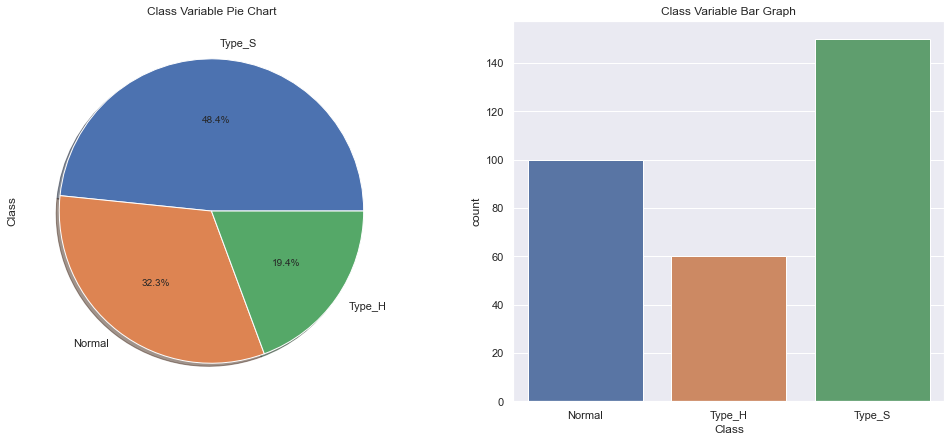

In [598]:
f,axes=plt.subplots(1,2,figsize=(17,7))
data_merged['Class'].value_counts().plot.pie(autopct='%1.1f%%',ax=axes[0],shadow=True)
sns.countplot('Class',data=data_merged,ax=axes[1])
axes[0].set_title('Class Variable Pie Chart')
axes[1].set_title('Class Variable Bar Graph')
plt.show()

**Here the data is n the ratio Normal:Type_H:Type_S = 10:6:15**

**If the imbalanced data is not treated beforehand, then this will degrade the performance of the classifier model. Most of the predictions will correspond to the majority class and treat the minority class features as noise in the data and ignore them. This will result in a high bias in the model.**

**Since data size is very less we will be oversampling the data**

In [604]:
x,y = data_merged.loc[:,data_merged.columns != 'Class'], data_merged.loc[:,'Class']
XScaled  = x.apply(zscore)
smote_nc=SMOTE(random_state=42) #specifying categorical column numbers
x_s,y_s=smote_nc.fit_resample(XScaled,y)

In [605]:
print('Before sampling:')
print(y.value_counts())

Before sampling:
Type_S    150
Normal    100
Type_H     60
Name: Class, dtype: int64


In [606]:
print('After sampling:')
print(y_s.value_counts())

After sampling:
Normal    150
Type_H    150
Type_S    150
Name: Class, dtype: int64


**• Perform train-test split.**

In [607]:
# Split X and y into training and test set in 70:30 ratio
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(XScaled, y, test_size=0.30, random_state=1)

In [609]:
x_train_res, x_test_res, y_train_res, y_test_res = train_test_split(x_s, y_s, test_size=0.30, random_state=1)

In [616]:
print(x_train.head())
print(x_train_res.head())
print(x_test.head())
print(x_test_res.head())

     P_incidence    P_tilt   L_angle   S_slope  P_radius  S_Degree
67      0.305642 -0.398257 -0.428141  0.716012  1.000747 -0.959724
123     0.610464  2.498917  1.760201 -0.706466  0.627258  1.809341
22      0.149747  0.937400  0.111696 -0.320415 -1.027645 -0.254616
34      0.146998  1.285701 -0.017594 -0.542014 -0.313906 -0.585690
37      0.826564  0.382386  1.662937  0.896171 -0.768699  0.441146
     P_incidence    P_tilt   L_angle   S_slope  P_radius  S_Degree
322    -0.521042 -0.157019 -0.943679 -0.496565  1.053579 -0.831200
98     -0.885823 -0.936217 -0.558613 -0.477128  0.042795 -0.872512
207     1.041874  2.011485  1.314314  0.152683  1.809706  2.181866
314    -0.482645 -0.338148 -0.798051 -0.333856 -0.116553 -0.635442
441    -1.040538  0.140801 -1.123840 -1.350109  0.137915 -0.811095
    P_incidence    P_tilt   L_angle   S_slope  P_radius  S_Degree
78     0.817515 -0.098230  0.361024  1.185460 -1.116574 -0.857249
84    -0.026293 -0.266832  0.329729  0.207492 -1.141799  0.32614

In [621]:
print("x_train: \n")
print(x_train.count())
print("x_train_res: \n")
print(x_train_res.count())
print("x_test: \n")
print(x_test.count())
print("x_test_res: \n")
print(x_test_res.count())

x_train: 

P_incidence    217
P_tilt         217
L_angle        217
S_slope        217
P_radius       217
S_Degree       217
dtype: int64
x_train_res: 

P_incidence    315
P_tilt         315
L_angle        315
S_slope        315
P_radius       315
S_Degree       315
dtype: int64
x_test: 

P_incidence    93
P_tilt         93
L_angle        93
S_slope        93
P_radius       93
S_Degree       93
dtype: int64
x_test_res: 

P_incidence    135
P_tilt         135
L_angle        135
S_slope        135
P_radius       135
S_Degree       135
dtype: int64


**Now we have data ready for training and testing**

**ACTIONS PERFORMED:**

        1. Segregate Data(feature and target)
        2. Scale data
        3. Remove outliers
        4. Sampled Data 
        5. Train-test split


**Final Data:**

        1. Training Data without sampling : 
            > x_train : 217 data with scaled and removed outliers
            > y_train : 217 data with scaled and removed outliers
        2. Testing Data without sampling : 
            > x_test : 93 data with scaled and removed outliers
            > y_test : 93 data with scaled and removed outliers
        3. Training Data with sampling : 
            > x_train_res : 315 data with scaled and removed outliers
            > y_train_res : 315 data with scaled and removed outliers
        4. Testing Data with sampling : 
            > x_test_res : 135 data with scaled and removed outliers
            > y_test_res : 135 data with scaled and removed outliers
            
       
       Total non-sampled dataset : 310
       Total sampled dataset : 450
       

## 5. Model training, testing and tuning:
    • Design and train a KNN classifier.
    • Display the classification accuracies for train and test data.
    • Display and explain the classification report in detail.
    • Automate the task of finding best values of K for KNN.
    • Apply all the possible tuning techniques to train the best model for the given data. Select the final best trained model with your comments for selecting this model.

In [622]:
def knn_analysis(x_train,y_train,x_test,y_test,n=3):
    knn = KNeighborsClassifier(n_neighbors = n)

    ############################################################################################
    # Design and train a KNN classifier.
    ############################################################################################

    knn.fit(x_train,y_train)
    prediction = knn.predict(x_test)
    print('Prediction: {}'.format(prediction))

    ############################################################################################
    # Display the classification accuracies for train and test data.
    ############################################################################################

    print('With KNN (K=3) accuracy of train data is: ',knn.score(x_train,y_train)) # accuracy
    print('With KNN (K=3) accuracy of test data is: ',knn.score(x_test,y_test)) # accuracy


    ############################################################################################
    #Display and explain the classification report in detail.
    ############################################################################################

    # Confusion Matrix
    from sklearn import metrics

    predicted_labels = knn.predict(x_test)
    print("Confusion Matrix")
    cm=metrics.confusion_matrix(y_test, predicted_labels, labels=["Normal", "Type_S", "Type_H"])

    df_cm = pd.DataFrame(cm, index = [i for i in ["Normal", "Type_S", "Type_H"]],
                      columns = [i for i in ["Predict Normal", "Predict Type_S", "Predicted Type_H"]])
    plt.figure(figsize = (7,5))
    sns.heatmap(df_cm, annot=True)


    # Classification Report
    print('\n{}'.format(classification_report(y_test, prediction)))


Prediction: ['Type_S' 'Type_S' 'Normal' 'Normal' 'Normal' 'Type_H' 'Type_H' 'Type_H'
 'Type_H' 'Type_S' 'Type_S' 'Type_S' 'Normal' 'Type_H' 'Type_S' 'Type_H'
 'Type_S' 'Type_S' 'Type_S' 'Normal' 'Type_S' 'Type_S' 'Normal' 'Type_S'
 'Normal' 'Type_S' 'Normal' 'Type_S' 'Normal' 'Type_S' 'Type_S' 'Type_S'
 'Type_S' 'Type_S' 'Normal' 'Type_S' 'Normal' 'Type_S' 'Normal' 'Type_H'
 'Type_S' 'Type_S' 'Normal' 'Type_S' 'Type_S' 'Type_H' 'Type_S' 'Type_S'
 'Normal' 'Type_S' 'Normal' 'Type_S' 'Normal' 'Normal' 'Type_S' 'Type_S'
 'Normal' 'Normal' 'Type_H' 'Type_H' 'Normal' 'Type_S' 'Type_S' 'Type_H'
 'Normal' 'Type_S' 'Normal' 'Type_S' 'Type_S' 'Type_S' 'Normal' 'Normal'
 'Type_S' 'Type_S' 'Type_S' 'Type_H' 'Type_H' 'Type_S' 'Type_S' 'Type_S'
 'Normal' 'Type_H' 'Type_S' 'Type_S' 'Normal' 'Type_H' 'Normal' 'Normal'
 'Type_H' 'Type_S' 'Normal' 'Type_S' 'Normal']
With KNN (K=3) accuracy of train data is:  0.9078341013824884
With KNN (K=3) accuracy of test data is:  0.7311827956989247
Confusion Matri

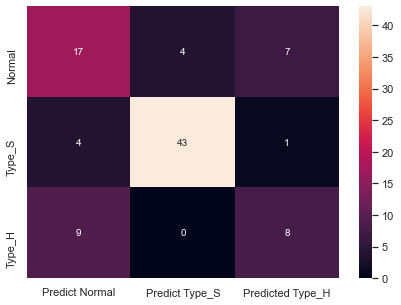

In [623]:
knn_analysis(x_train,y_train,x_test,y_test)

### Inferences of KNN without sampling:

**Accuracy** 

Testing accuracy here remains **poor** with 0.7311827956989247 though training accuracy is high


**Confusion Matrix :**

    1. We can see that Type_S here has **high** precision and recall, which is very good. That means the model is good at detecting postive Type_S cases. 
    Also in matrix we can see that only 4 cases has been predicted Type_S wrong i.e. we wrongly predicted normal as Type_S.
    And 5 scenario are predicted wrongly out of 48 as Type_H(1) and Normal(4).
    Hence f1 score (weighted mean of precesion and recall) is also good.
    
    2. Normal and Type_H here have poor precision, recall and f1 score. Same is reflected in matrix
    
    3. Overall macro avg(average over each category) is poor.
    
    4. Overall weighted average(average over weighted data) is higher due to higher contribution from Type_S
    

Prediction: ['Type_H' 'Normal' 'Type_H' 'Normal' 'Normal' 'Type_S' 'Normal' 'Type_H'
 'Normal' 'Normal' 'Normal' 'Normal' 'Type_H' 'Normal' 'Normal' 'Type_H'
 'Normal' 'Type_S' 'Type_H' 'Type_S' 'Type_H' 'Type_S' 'Type_S' 'Type_S'
 'Normal' 'Type_H' 'Type_H' 'Type_H' 'Type_S' 'Type_H' 'Normal' 'Normal'
 'Type_S' 'Type_S' 'Type_S' 'Normal' 'Type_H' 'Type_S' 'Type_S' 'Type_S'
 'Type_H' 'Type_S' 'Type_S' 'Normal' 'Type_H' 'Normal' 'Normal' 'Type_H'
 'Type_H' 'Type_H' 'Type_H' 'Type_H' 'Type_H' 'Type_S' 'Type_H' 'Type_S'
 'Type_S' 'Type_S' 'Normal' 'Type_S' 'Type_H' 'Type_S' 'Normal' 'Normal'
 'Type_H' 'Type_S' 'Type_H' 'Type_S' 'Type_S' 'Normal' 'Normal' 'Type_S'
 'Normal' 'Type_H' 'Type_S' 'Type_S' 'Type_H' 'Type_S' 'Normal' 'Normal'
 'Normal' 'Normal' 'Normal' 'Type_S' 'Type_S' 'Normal' 'Normal' 'Normal'
 'Normal' 'Type_H' 'Type_H' 'Type_S' 'Normal' 'Normal' 'Type_H' 'Normal'
 'Normal' 'Type_S' 'Type_S' 'Normal' 'Normal' 'Normal' 'Type_S' 'Type_H'
 'Normal' 'Type_H' 'Type_H' 'Type_S' 'N

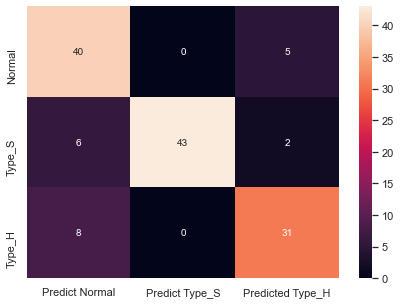

In [624]:
knn_analysis(x_train_res,y_train_res,x_test_res,y_test_res)

### Inferences of KNN with sampling:

**Accuracy** 

Testing accuracy here is **better** with 0.8444444444444444.


**Confusion Matrix :**

    1. Here Type_S has best precision(1) but recall has dipped here. But overall f1 score remains similar to without sampling. 
    Hence this model has not predicted Types_S incorrect as in matrix its 0 and 0 for normal and type_H. 
    Though it has predicted few Type_S as Normal (6) and Type_H(2) which affected its recall score.
    
    2. Normal and Type_H here have better precision, recall and f1 score. Same is reflected in matrix
    
    3. Overall macro avg(average over each category) has improved compared to without sampling,which infers better predictions accross all categories.
    
    4. Overall weighted average(average weighted data) has improved compared to without sampling and nearly similar to macro avg.
    

In [626]:
y_test.value_counts()

Type_S    48
Normal    28
Type_H    17
Name: Class, dtype: int64

**NOTE : Since its multi class format we are skipping the ROC AUC curve as its becomes complex and inconclusive overall**

In [627]:
def knn_optimisation(x_train,y_train,x_test,y_test):
    neigbor = np.arange(1, 30)
    train_accuracy = []
    test_accuracy = []
    # Loop over different values of k
    for i, k in enumerate(neigbor):
        # k from 1 to 25(exclude)
        knn = KNeighborsClassifier(n_neighbors=k)
        # Fit with knn
        knn.fit(x_train,y_train)
        #train accuracy
        train_accuracy.append(knn.score(x_train, y_train))
        # test accuracy
        test_accuracy.append(knn.score(x_test, y_test))

    # Plot
    plt.figure(figsize=[13,8])
    plt.plot(neigbor, test_accuracy, label = 'Testing Accuracy')
    plt.plot(neigbor, train_accuracy, label = 'Training Accuracy')
    plt.legend()
    plt.title('-value VS Accuracy')
    plt.xlabel('Number of Neighbors')
    plt.ylabel('Accuracy')
    plt.xticks(neigbor)
    plt.savefig('graph.png')
    plt.show()
    print("Best accuracy is {} with K = {}".format(np.max(test_accuracy),1+test_accuracy.index(np.max(test_accuracy))))

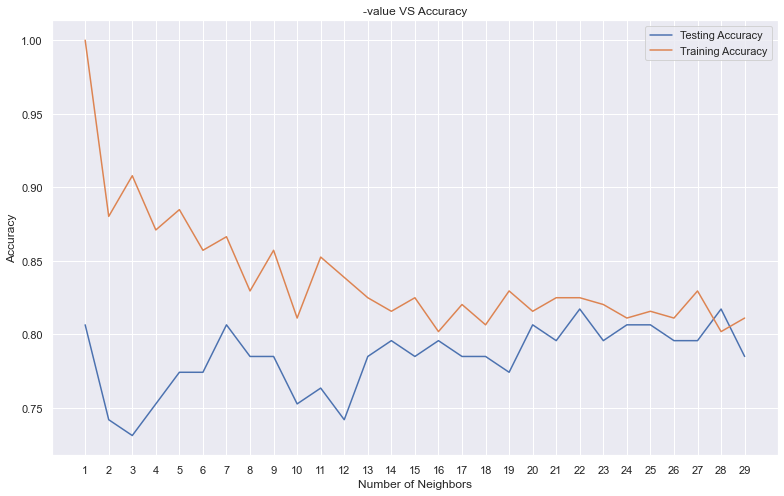

Best accuracy is 0.8172043010752689 with K = 22


In [628]:
knn_optimisation(x_train,y_train,x_test,y_test)

Prediction: ['Type_S' 'Type_S' 'Normal' 'Normal' 'Normal' 'Normal' 'Type_H' 'Type_H'
 'Type_H' 'Type_S' 'Type_S' 'Type_S' 'Normal' 'Type_H' 'Type_S' 'Type_H'
 'Type_S' 'Type_S' 'Type_S' 'Normal' 'Type_S' 'Type_S' 'Normal' 'Type_S'
 'Normal' 'Type_S' 'Normal' 'Type_S' 'Normal' 'Type_S' 'Type_S' 'Type_S'
 'Type_S' 'Type_S' 'Normal' 'Type_S' 'Normal' 'Type_S' 'Type_H' 'Type_H'
 'Type_S' 'Type_S' 'Normal' 'Type_S' 'Type_S' 'Type_H' 'Type_S' 'Type_S'
 'Normal' 'Type_S' 'Normal' 'Type_S' 'Normal' 'Normal' 'Type_S' 'Type_S'
 'Normal' 'Type_H' 'Type_H' 'Type_H' 'Normal' 'Type_S' 'Type_S' 'Normal'
 'Type_H' 'Type_S' 'Normal' 'Type_S' 'Type_S' 'Type_S' 'Type_H' 'Normal'
 'Type_S' 'Type_S' 'Type_S' 'Normal' 'Type_H' 'Type_S' 'Type_S' 'Type_S'
 'Normal' 'Normal' 'Type_S' 'Type_S' 'Normal' 'Normal' 'Type_H' 'Normal'
 'Normal' 'Type_S' 'Normal' 'Type_S' 'Type_H']
With KNN (K=3) accuracy of train data is:  0.8248847926267281
With KNN (K=3) accuracy of test data is:  0.8172043010752689
Confusion Matri

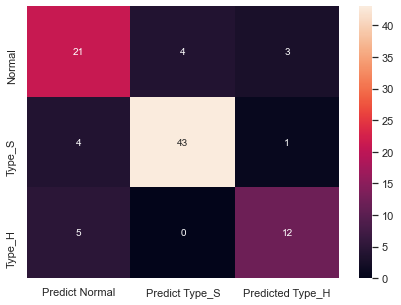

In [630]:
knn_analysis(x_train,y_train,x_test,y_test,n=22)

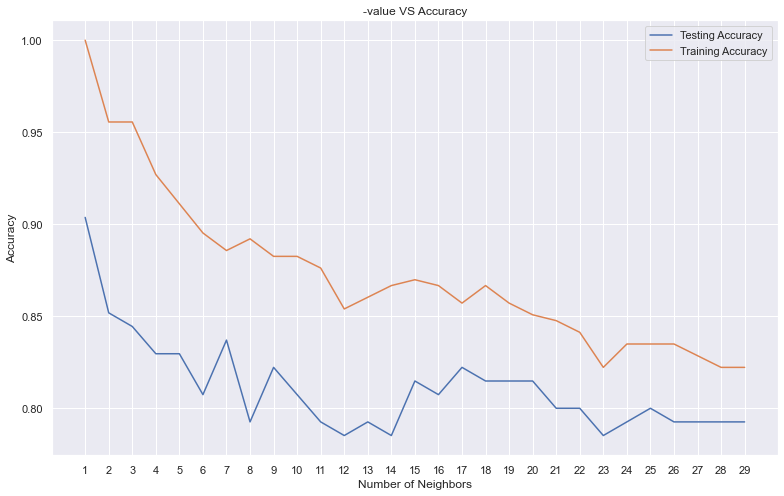

Best accuracy is 0.9037037037037037 with K = 1


In [631]:
knn_optimisation(x_train_res,y_train_res,x_test_res,y_test_res)

Since K=1 will be overfitting the data we will be using k =3 for the over sampled data. We have already done for k=3. We can also check for k=2, though its **overfitting**

Prediction: ['Type_H' 'Normal' 'Type_H' 'Normal' 'Normal' 'Type_S' 'Normal' 'Type_H'
 'Normal' 'Type_H' 'Normal' 'Normal' 'Type_H' 'Normal' 'Normal' 'Type_H'
 'Normal' 'Type_S' 'Normal' 'Type_S' 'Type_H' 'Type_S' 'Type_S' 'Type_S'
 'Normal' 'Normal' 'Type_H' 'Type_H' 'Type_S' 'Type_H' 'Normal' 'Normal'
 'Type_S' 'Type_S' 'Type_S' 'Normal' 'Normal' 'Type_S' 'Type_S' 'Type_S'
 'Type_H' 'Type_S' 'Type_S' 'Normal' 'Type_H' 'Normal' 'Normal' 'Type_H'
 'Type_H' 'Type_H' 'Type_H' 'Type_H' 'Type_H' 'Type_S' 'Type_H' 'Type_S'
 'Type_S' 'Type_S' 'Normal' 'Normal' 'Type_H' 'Type_S' 'Normal' 'Normal'
 'Type_H' 'Type_S' 'Type_H' 'Type_S' 'Type_S' 'Normal' 'Normal' 'Type_S'
 'Normal' 'Type_H' 'Normal' 'Type_S' 'Type_H' 'Type_S' 'Normal' 'Normal'
 'Normal' 'Normal' 'Normal' 'Type_S' 'Type_S' 'Normal' 'Normal' 'Normal'
 'Normal' 'Type_H' 'Type_H' 'Type_S' 'Normal' 'Normal' 'Type_H' 'Normal'
 'Normal' 'Type_S' 'Type_S' 'Normal' 'Normal' 'Normal' 'Type_S' 'Type_H'
 'Normal' 'Type_H' 'Type_H' 'Type_S' 'N

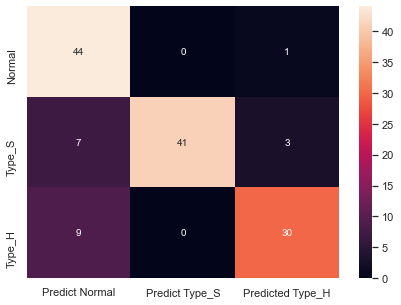

In [646]:
knn_analysis(x_train_res,y_train_res,x_test_res,y_test_res,n=2)

**We can see that overall all the scores has improved**

**Accuracy is now 85.2% which is better**

    There are hyperparameters that are need to be tuned

    For example:
        k at KNN
        linear regression parameters(coefficients)
    Hyperparameter tuning:
        try all of combinations of different parameters
        fit all of them
        measure prediction performance
        see how well each performs
        finally choose best hyperparameters

In [633]:
# grid search cross validation with 1 hyperparameter
from sklearn.model_selection import GridSearchCV
grid = {'n_neighbors': np.arange(1,50)}
knn = KNeighborsClassifier()
knn_cv = GridSearchCV(knn, grid, cv=3) 
knn_cv.fit(x_train,y_train)

# Print hyperparameter
print("Tuned hyperparameter k: {}".format(knn_cv.best_params_)) 
print("Best score: {}".format(knn_cv.best_score_))

grid = {'n_neighbors': np.arange(1,50)}
knn = KNeighborsClassifier()
knn_cv = GridSearchCV(knn, grid, cv=3) 
knn_cv.fit(x_train_res,y_train_res)

# Print hyperparameter
print("Tuned hyperparameter k(SAMPLED): {}".format(knn_cv.best_params_)) 
print("Best score(SAMPLED): {}".format(knn_cv.best_score_))

Tuned hyperparameter k: {'n_neighbors': 7}
Best score: 0.8158295281582953
Tuned hyperparameter k(SAMPLED): {'n_neighbors': 1}
Best score(SAMPLED): 0.8761904761904762


### Naive Bayes

In [634]:
def naive_bayes_analysis(x_train,y_train,x_test,y_test):
    clf = GaussianNB()
    ############################################################################################
    # Design and train a Naive Bayes Classifier
    ############################################################################################

    clf.fit(x_train, y_train)
    prediction = clf.predict(x_test)
    print('Prediction: {}'.format(prediction))

    ############################################################################################
    # Display the classification accuracies for train and test data.
    ############################################################################################

    print('With NB accuracy of train data is: ',clf.score(x_train,y_train)) # accuracy
    print('With NB accuracy of test data is: ',clf.score(x_test,y_test)) # accuracy


    ############################################################################################
    #Display and explain the classification report in detail.
    ############################################################################################

    # Confusion Matrix
    from sklearn import metrics

    predicted_labels = clf.predict(x_test)
    print("Confusion Matrix")
    cm=metrics.confusion_matrix(y_test, predicted_labels, labels=["Normal", "Type_S", "Type_H"])

    df_cm = pd.DataFrame(cm, index = [i for i in ["Normal", "Type_S", "Type_H"]],
                      columns = [i for i in ["Predict Normal", "Predict Type_S", "Predicted Type_H"]])
    plt.figure(figsize = (7,5))
    sns.heatmap(df_cm, annot=True)


    # Classification Report
    print('\n{}'.format(classification_report(y_test, prediction)))


Prediction: ['Type_S' 'Type_S' 'Normal' 'Type_H' 'Normal' 'Normal' 'Type_S' 'Type_H'
 'Type_H' 'Type_S' 'Type_S' 'Type_S' 'Normal' 'Type_H' 'Type_S' 'Type_H'
 'Type_S' 'Type_S' 'Type_S' 'Normal' 'Type_S' 'Type_S' 'Type_H' 'Type_S'
 'Normal' 'Type_S' 'Normal' 'Type_S' 'Normal' 'Type_S' 'Type_S' 'Type_S'
 'Type_S' 'Type_S' 'Normal' 'Type_S' 'Normal' 'Type_S' 'Type_H' 'Type_H'
 'Type_S' 'Type_S' 'Normal' 'Type_S' 'Type_S' 'Type_H' 'Type_S' 'Type_S'
 'Type_S' 'Type_S' 'Type_H' 'Type_S' 'Normal' 'Normal' 'Type_S' 'Type_S'
 'Normal' 'Type_H' 'Type_H' 'Type_H' 'Normal' 'Type_S' 'Type_S' 'Type_H'
 'Type_H' 'Type_S' 'Type_H' 'Type_S' 'Type_S' 'Type_S' 'Type_H' 'Normal'
 'Type_S' 'Type_S' 'Type_S' 'Type_H' 'Type_H' 'Type_S' 'Type_S' 'Type_S'
 'Normal' 'Normal' 'Type_S' 'Type_S' 'Normal' 'Type_H' 'Type_H' 'Normal'
 'Normal' 'Type_S' 'Normal' 'Type_S' 'Type_H']
With NB accuracy of train data is:  0.8617511520737328
With NB accuracy of test data is:  0.7849462365591398
Confusion Matrix

           

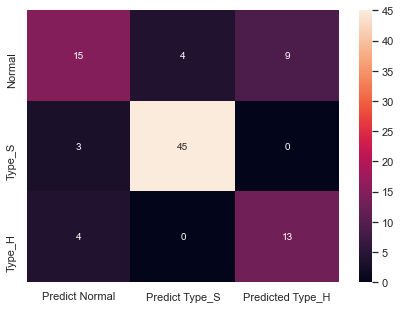

In [635]:
naive_bayes_analysis(x_train,y_train,x_test,y_test)

### Inferences of Naive Bayes without sampling:

**Accuracy** 

Testing accuracy here remains **poor** with 0.7849462365591398 though training accuracy is high.


**Confusion Matrix :**

    1. We can see that Type_S here has **high** precision and recall, which is very good. That means the model is good at detecting postive Type_S cases. 
    Also in matrix we can see that only 4 cases has been predicted Type_S wrong i.e. we wrongly predicted normal as Type_S.
    And 3 scenario are predicted wrongly out of 48 as Normal(3).
    Hence f1 score (weighted mean of precesion and recall) is also good.
    
    2. Normal and Type_H here have poor precision and f1 score. Recall is better for type_H but poor for normal. Same is reflected in matrix
    
    3. Overall macro avg(average over each category) is poor.
    
    4. Overall weighted average(average over weighted data) is higher due to higher contribution from Type_S
    

Prediction: ['Type_H' 'Type_H' 'Type_H' 'Normal' 'Normal' 'Type_S' 'Normal' 'Type_H'
 'Type_H' 'Type_S' 'Normal' 'Type_H' 'Type_H' 'Normal' 'Type_H' 'Type_H'
 'Type_S' 'Type_S' 'Normal' 'Type_S' 'Type_H' 'Type_S' 'Type_S' 'Type_S'
 'Normal' 'Type_H' 'Type_H' 'Type_H' 'Type_S' 'Normal' 'Normal' 'Normal'
 'Type_S' 'Type_S' 'Type_S' 'Normal' 'Type_H' 'Type_S' 'Type_S' 'Type_S'
 'Type_H' 'Type_S' 'Type_S' 'Normal' 'Type_H' 'Normal' 'Normal' 'Type_H'
 'Type_H' 'Type_H' 'Type_H' 'Type_H' 'Type_H' 'Type_S' 'Type_H' 'Type_S'
 'Type_S' 'Type_S' 'Type_S' 'Type_S' 'Type_H' 'Type_S' 'Normal' 'Normal'
 'Type_H' 'Type_S' 'Type_H' 'Type_S' 'Type_S' 'Normal' 'Normal' 'Type_S'
 'Type_H' 'Type_H' 'Type_S' 'Type_S' 'Type_H' 'Type_S' 'Type_H' 'Normal'
 'Type_S' 'Type_S' 'Type_H' 'Type_S' 'Type_S' 'Normal' 'Type_H' 'Normal'
 'Type_H' 'Normal' 'Type_H' 'Type_S' 'Normal' 'Type_H' 'Type_H' 'Type_H'
 'Normal' 'Type_S' 'Type_S' 'Normal' 'Normal' 'Type_H' 'Type_S' 'Type_S'
 'Normal' 'Type_H' 'Type_H' 'Type_S' 'N

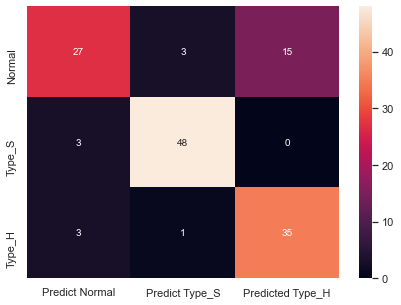

In [636]:
naive_bayes_analysis(x_train_res,y_train_res,x_test_res,y_test_res)

### Inferences of Naive Bayes with sampling:

**Accuracy** 

Testing accuracy here is **better** with 0.8148148148148148.


**Confusion Matrix :**

    1. Here type_S has similar precision, recall and f1 score as non-sampled data.
    
    2. Normal and Type_H here have better precision, recall and f1 score. Same is reflected in matrix
    
    3. Overall macro avg(average over each category) has improved compared to without sampling,which infers better predictions accross all categories.
    
    4. Overall weighted average(average weighted data) has improved compared to without sampling and nearly similar to macro avg.
    

### Logistic Regression

In [647]:
def logistic_regression_analysis(x_train,y_train,x_test,y_test):
    # Fit the model on train
    logreg = LogisticRegression()
    ############################################################################################
    # Design and train a logistic regression
    ############################################################################################

    logreg.fit(x_train, y_train)
    prediction = logreg.predict(x_test)
    print('Prediction: {}'.format(prediction))

    ############################################################################################
    # Display the classification accuracies for train and test data.
    ############################################################################################

    print('With logistic regression accuracy of train data is: ',logreg.score(x_train,y_train)) # accuracy
    print('With logistic regression accuracy of test data is: ',logreg.score(x_test,y_test)) # accuracy


    ############################################################################################
    #Display and explain the classification report in detail.
    ############################################################################################

    # Confusion Matrix
    predicted_labels = logreg.predict(x_test)
    print("Confusion Matrix")
    cm=metrics.confusion_matrix(y_test, predicted_labels, labels=["Normal", "Type_S", "Type_H"])

    df_cm = pd.DataFrame(cm, index = [i for i in ["Normal", "Type_S", "Type_H"]],
                      columns = [i for i in ["Predict Normal", "Predict Type_S", "Predicted Type_H"]])
    plt.figure(figsize = (7,5))
    sns.heatmap(df_cm, annot=True)


    # Classification Report
    print('\n{}'.format(classification_report(y_test, prediction)))




Prediction: ['Normal' 'Type_S' 'Type_S' 'Normal' 'Normal' 'Normal' 'Type_H' 'Type_H'
 'Type_H' 'Type_S' 'Type_S' 'Type_S' 'Normal' 'Type_H' 'Type_S' 'Type_H'
 'Type_S' 'Type_S' 'Type_S' 'Normal' 'Type_S' 'Type_S' 'Normal' 'Type_S'
 'Normal' 'Type_S' 'Normal' 'Type_S' 'Normal' 'Type_S' 'Type_S' 'Type_S'
 'Type_S' 'Type_S' 'Normal' 'Type_S' 'Normal' 'Type_S' 'Type_H' 'Type_H'
 'Type_S' 'Type_S' 'Normal' 'Type_S' 'Type_S' 'Type_H' 'Type_S' 'Type_S'
 'Type_S' 'Type_S' 'Normal' 'Type_S' 'Normal' 'Type_S' 'Type_S' 'Normal'
 'Normal' 'Type_H' 'Type_H' 'Type_H' 'Normal' 'Type_S' 'Type_S' 'Type_H'
 'Type_H' 'Type_S' 'Normal' 'Type_S' 'Type_S' 'Normal' 'Type_H' 'Normal'
 'Type_S' 'Type_S' 'Type_S' 'Type_H' 'Type_H' 'Type_S' 'Type_S' 'Type_S'
 'Normal' 'Normal' 'Type_S' 'Type_S' 'Normal' 'Normal' 'Type_H' 'Normal'
 'Normal' 'Type_S' 'Normal' 'Type_S' 'Type_H']
With logistic regression accuracy of train data is:  0.8709677419354839
With logistic regression accuracy of test data is:  0.838709677419

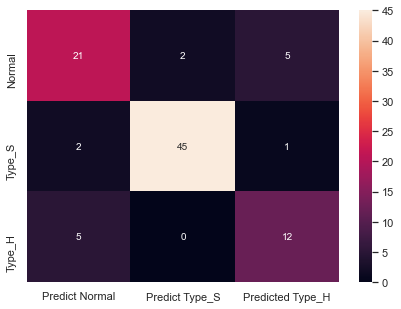

In [648]:
logistic_regression_analysis(x_train,y_train,x_test,y_test)

### Inferences of Logistic Regression without sampling:

**Accuracy** 

Testing accuracy is **good** with 0.8387096774193549.

**Confusion Matrix :**

    1. Here recall, precision and f1 score are better for all categories as compared to previous model without sampling. Type_S remains with very good score.
    
    3. Overall macro avg(average over each category) is better.
    
    4. Overall weighted average(average over weighted data) is higher due to higher contribution from Type_S

Prediction: ['Normal' 'Normal' 'Normal' 'Normal' 'Normal' 'Type_S' 'Normal' 'Type_H'
 'Normal' 'Type_S' 'Normal' 'Normal' 'Type_H' 'Normal' 'Type_H' 'Type_H'
 'Type_H' 'Type_S' 'Normal' 'Type_S' 'Type_H' 'Type_S' 'Type_S' 'Type_S'
 'Normal' 'Normal' 'Type_H' 'Type_H' 'Type_S' 'Type_H' 'Normal' 'Normal'
 'Type_S' 'Type_S' 'Type_S' 'Type_S' 'Type_H' 'Normal' 'Type_S' 'Type_S'
 'Normal' 'Type_S' 'Type_S' 'Normal' 'Type_H' 'Normal' 'Normal' 'Type_H'
 'Type_H' 'Type_H' 'Type_H' 'Type_H' 'Type_H' 'Type_S' 'Type_H' 'Type_S'
 'Type_S' 'Type_S' 'Type_S' 'Type_S' 'Type_H' 'Type_S' 'Normal' 'Normal'
 'Type_H' 'Type_S' 'Type_H' 'Type_S' 'Type_S' 'Normal' 'Normal' 'Type_S'
 'Normal' 'Normal' 'Type_S' 'Type_S' 'Type_H' 'Type_S' 'Normal' 'Normal'
 'Normal' 'Normal' 'Normal' 'Type_S' 'Type_S' 'Normal' 'Type_H' 'Normal'
 'Normal' 'Type_H' 'Type_H' 'Type_S' 'Normal' 'Type_H' 'Type_H' 'Type_H'
 'Normal' 'Type_S' 'Type_S' 'Normal' 'Normal' 'Type_H' 'Type_S' 'Type_H'
 'Normal' 'Type_H' 'Type_H' 'Type_S' 'N

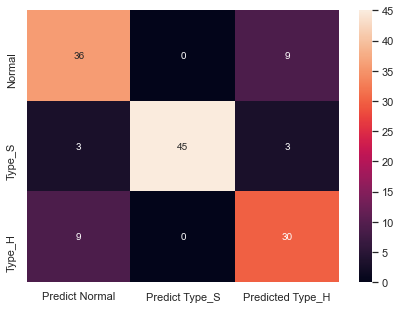

In [649]:
logistic_regression_analysis(x_train_res,y_train_res,x_test_res,y_test_res)

### Inferences of Logistic Regression  with sampling:

**Accuracy** 

Testing accuracy here is **decreased** 0.8222222222222222 as compared to without sampling.


**Confusion Matrix :**

    1. Precesion, recall and f1 score has improved here for type_s and normal
    
    2. Type_S has better recesion though recall has decreased.
    
    3. Overall macro avg(average over each category) has improved compared to without sampling,which infers better predictions accross all categories.
    
    4. Overall weighted average(average weighted data) has decreased compared to without sampling and nearly similar to macro avg.

### Support Vector Machine

In [650]:
def svm_analysis(x_train,y_train,x_test,y_test):
    clf = svm.SVC(gamma=0.025, C=3)    
    ############################################################################################
    # Design and train a Naive Bayes Classifier
    ############################################################################################

    clf.fit(x_train, y_train)
    prediction = clf.predict(x_test)
    print('Prediction: {}'.format(prediction))

    ############################################################################################
    # Display the classification accuracies for train and test data.
    ############################################################################################

    print('With SVM accuracy of train data is: ',clf.score(x_train,y_train)) # accuracy
    print('With SVM accuracy of test data is: ',clf.score(x_test,y_test)) # accuracy


    ############################################################################################
    #Display and explain the classification report in detail.
    ############################################################################################

    # Confusion Matrix
    from sklearn import metrics

    predicted_labels = clf.predict(x_test)
    print("Confusion Matrix")
    cm=metrics.confusion_matrix(y_test, predicted_labels, labels=["Normal", "Type_S", "Type_H"])

    df_cm = pd.DataFrame(cm, index = [i for i in ["Normal", "Type_S", "Type_H"]],
                      columns = [i for i in ["Predict Normal", "Predict Type_S", "Predicted Type_H"]])
    plt.figure(figsize = (7,5))
    sns.heatmap(df_cm, annot=True)


    # Classification Report
    print('\n{}'.format(classification_report(y_test, prediction)))


Prediction: ['Normal' 'Type_S' 'Type_S' 'Normal' 'Normal' 'Type_H' 'Type_H' 'Type_H'
 'Type_H' 'Type_S' 'Type_S' 'Type_S' 'Normal' 'Type_H' 'Type_S' 'Type_H'
 'Type_S' 'Type_S' 'Type_S' 'Normal' 'Type_S' 'Type_S' 'Normal' 'Type_S'
 'Normal' 'Type_S' 'Normal' 'Type_S' 'Normal' 'Type_S' 'Type_S' 'Type_S'
 'Type_S' 'Type_S' 'Normal' 'Type_S' 'Normal' 'Type_S' 'Type_H' 'Type_H'
 'Type_S' 'Type_S' 'Normal' 'Type_S' 'Type_S' 'Type_H' 'Type_S' 'Type_S'
 'Type_S' 'Type_S' 'Normal' 'Type_S' 'Normal' 'Type_S' 'Normal' 'Normal'
 'Normal' 'Type_H' 'Type_H' 'Type_H' 'Normal' 'Type_S' 'Type_S' 'Type_H'
 'Type_H' 'Type_S' 'Normal' 'Type_S' 'Type_S' 'Normal' 'Type_H' 'Normal'
 'Type_S' 'Type_S' 'Type_S' 'Type_H' 'Type_H' 'Type_S' 'Type_S' 'Type_S'
 'Normal' 'Normal' 'Type_S' 'Type_S' 'Normal' 'Normal' 'Type_H' 'Normal'
 'Normal' 'Type_S' 'Normal' 'Type_S' 'Type_H']
With SVM accuracy of train data is:  0.880184331797235
With SVM accuracy of test data is:  0.8602150537634409
Confusion Matrix

          

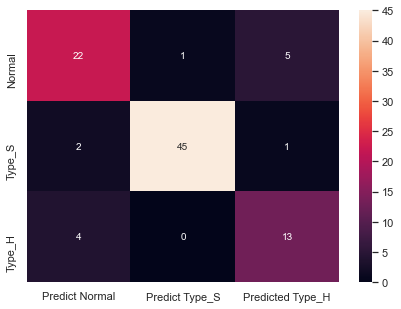

In [651]:
svm_analysis(x_train,y_train,x_test,y_test)

### Inferences of SVM without sampling:

**Accuracy** 

Testing accuracy **good** with 0.8602150537634409.

**Confusion Matrix :**

    1. Here recall, precision and f1 score are better for all categories. Type_S remains with very good score.
    
    3. Overall macro avg(average over each category) is better.
    
    4. Overall weighted average(average over weighted data) is higher.

Prediction: ['Type_H' 'Normal' 'Type_H' 'Normal' 'Normal' 'Type_S' 'Normal' 'Type_H'
 'Type_H' 'Type_S' 'Normal' 'Normal' 'Type_H' 'Normal' 'Type_H' 'Type_H'
 'Type_H' 'Type_S' 'Normal' 'Type_S' 'Type_H' 'Type_S' 'Type_S' 'Type_S'
 'Normal' 'Normal' 'Type_H' 'Type_H' 'Type_S' 'Type_H' 'Normal' 'Normal'
 'Type_S' 'Type_S' 'Type_S' 'Type_S' 'Type_H' 'Normal' 'Type_S' 'Type_S'
 'Type_H' 'Type_S' 'Type_S' 'Normal' 'Type_H' 'Normal' 'Normal' 'Type_H'
 'Type_H' 'Type_H' 'Type_H' 'Type_H' 'Type_H' 'Type_S' 'Type_H' 'Type_S'
 'Type_S' 'Type_S' 'Type_S' 'Normal' 'Type_H' 'Type_S' 'Normal' 'Normal'
 'Type_H' 'Type_S' 'Type_H' 'Type_S' 'Type_S' 'Normal' 'Normal' 'Type_S'
 'Normal' 'Type_H' 'Type_S' 'Type_S' 'Type_H' 'Type_S' 'Type_H' 'Normal'
 'Normal' 'Normal' 'Normal' 'Type_S' 'Type_S' 'Normal' 'Type_H' 'Normal'
 'Normal' 'Type_H' 'Type_H' 'Type_S' 'Normal' 'Type_H' 'Type_H' 'Type_H'
 'Normal' 'Type_S' 'Type_S' 'Normal' 'Normal' 'Type_H' 'Type_S' 'Type_S'
 'Normal' 'Type_H' 'Type_H' 'Type_S' 'N

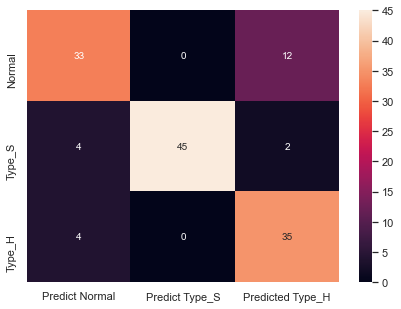

In [652]:
svm_analysis(x_train_res,y_train_res,x_test_res,y_test_res)

### Inferences of SVM with sampling:

**Accuracy** 

Testing accuracy here is **decreased** 0.837037037037037 as compared to without sampling.


**Confusion Matrix :**

    1. Precesion, recall and f1 score has improved here for all categories
    
    3. Overall macro avg(average over each category) has improved compared to without sampling,which infers better predictions accross all categories.
    
    4. Overall weighted average(average weighted data) has decreased compared to without sampling and nearly similar to macro avg.

In [653]:
def SVM_optimization(X_train, X_test, y_train, y_test):
    best_score=0
    gammas=[0.001, 0.01, 0.1, 1, 10, 100]
    Cs=[0.001, 0.01, 0.1, 1, 10, 100]
    kernels=['rbf', 'linear']
    
    for gamma in gammas:
        for C in Cs:
            for kernel in kernels:
                clf=svm.SVC(kernel=kernel,gamma=gamma, C=C)
                clf.fit(X_train, y_train)
                
                score=clf.score(X_test, y_test)

                if score>best_score:
                    y_pred=clf.predict(X_test)
                    best_score=score
                    best_params={'kernel':kernel, 'C':C, 'gamma':gamma}
        
    print("best score:",best_score)
    print("best params:",best_params)
    print("classification reports:\n",classification_report(y_test, y_pred))
    
print("SVM without Sampling: ")
SVM_optimization(x_train,x_test,y_train,y_test)
print("SVM with Sampling: ")
SVM_optimization(x_train_res,x_test_res,y_train_res,y_test_res)

SVM without Sampling: 
best score: 0.8709677419354839
best params: {'kernel': 'linear', 'C': 1, 'gamma': 0.001}
classification reports:
               precision    recall  f1-score   support

      Normal       0.79      0.79      0.79        28
      Type_H       0.72      0.76      0.74        17
      Type_S       0.98      0.96      0.97        48

    accuracy                           0.87        93
   macro avg       0.83      0.84      0.83        93
weighted avg       0.87      0.87      0.87        93

SVM with Sampling: 
best score: 0.8740740740740741
best params: {'kernel': 'rbf', 'C': 10, 'gamma': 1}
classification reports:
               precision    recall  f1-score   support

      Normal       0.82      0.80      0.81        45
      Type_H       0.83      0.87      0.85        39
      Type_S       0.96      0.94      0.95        51

    accuracy                           0.87       135
   macro avg       0.87      0.87      0.87       135
weighted avg       0.87     

## 6. Conclusion and improvisation:
**• Write your conclusion on the results.**

**• Detailed suggestions or improvements or on quality, quantity, variety, velocity, veracity etc. on the data points
collected by the research team to perform a better data analysis in future.**

**Conclusion:**

For individual model inferences are presented above for each model.

Overall conclusion is below:

Reference: 

**Precision:** When it predicts the positive result, how often is it correct? i.e. limit the number of false positives.

**Recall:** When it is actually the positive result, how often does it predict correctly? i.e. limit the number of false negatives.

**f1-score:** Harmonic mean of precision and recall.


| Model | precision(macro) | recall(macro) | f1-score(macro) |  precision-weighted |  recall-weighted |  f1-score-weighted | Accuracy | Remark |
| --- | --- | --- | --- | --- | --- | --- | --- | --- |
| KNN without sampling and without optimisation |  0.66 | 0.66 | 0.66 | 0.73 | 0.73 | 0.73 | 73.11 | Good with Type_S prediction |
| KNN with sampling and without optimisation |  0.85 | 0.84 | 0.84 | 0.86 | 0.84 | 0.85 | 84.44 | Improved accuracy compared to without sapling|
| KNN without sampling and with optimisation k=22 | 0.79 | 0.78 | 0.79 | 0.82 | 0.82 | 0.82 | 81.72 | Better result than without optimisation |
| KNN with sampling and with optimisation k=2 | 0.87 | 0.85 | 0.85 | 0.88 | 0.85 | 0.85 | 85.19 | Better result than without optimisation |
| Naive Bayes without sampling | 0.73 | 0.75 | 0.73 | 0.79 | 0.78 | 0.78 | 78.5 | 
| Naive Bayes with sampling | 0.81 | 0.81 | 0.8 |  0.82 | 0.81 | 0.81 | 81.48 | Better result for Type_H |
| Logistic regression without sampling |  0.79 | 0.8 |  0.79 | 0.84 | 0.84 | 0.84 | 83.87 |
| Logistic regression with sampling |  0.82 | 0.82 | 0.82 | 0.83 | 0.82 | 0.83 | 82.22 | Uniform recall and precission across the types | 
| SVM with optimisation and withou sampling | 0.83 | 0.84 | 0.83 | 0.87 | 0.87 | 0.87 | 87.1 | Good accuracy and recall |
| SVM with optimisation and with sampling |  0.87 | 0.87 | 0.87 | 0.87 | 0.87 | 0.87 | 87.4 | Best result in terms of parameters shown |



Hence we can say that in terms of **overall accuracy** and **confusion matrix** parameter **SVM has shown best results.**

**But depending on requirement and importance of catagory we can again select best model suited.**

**For example:** 

If we are interested in identifying the **Type_S** catagory more we can go for best model with f1 score for type_S category i.e. **SVM with optimisation**. 

Similarly if we are interested in **Type_H**, we can go for **SVM with optimisation** f1 of 0.85 for type_H

Similarly if we are interested in **normal**, we can go for **KNN with optimisation** f1 of 0.84 for normal


Also if we are interested in **reducing false positive results more**, we can look for **highest precision** for that category. 

And if we are interested in **reducing false negetive results** more, we can look for **highest recall** for that category.

**Hence, depending on our requirement, area of focus(False positive or false negetive) and importance of category(normal,types_S,type_H) we can select the best suited model.**

**• Detailed suggestions or improvements or on quality, quantity, variety, velocity, veracity etc. on the data points collected by the research team to perform a better data analysis in future.**

In [655]:
#import pandas_profiling
import pandas_profiling 
data_profiling = pd.concat([data_N, data_H, data_S])

pandas_profiling.ProfileReport(data_profiling)

Summarize dataset:   0%|          | 0/21 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

1. Size of data is small( 310) 
2. Data is not balanced. Balanced data helps in having each class equal weightage. If data is unbalanced, model is influenced more by one category and treats others as noise. Though we are doing oversampling/undersampling, this doesnt give real life results.
3. S_slope is highly skewed.
4. There were outliers.
5. There is collinearity between P_incidence and L_angle, P_incidence and S_slope and others
6. Type_S data are present in larger number
7. Type_H data are minimum.
8. Data are not scaled and missing units to have proper conclusions.


**========================================================================================================================**

#                                        END OF PART ONE
**========================================================================================================================**

# PART TWO

## QUESTION: 
    • DOMAIN: Banking and finance
    • CONTEXT: A bank X is on a massive digital transformation for all its departments. Bank has a growing customer base whee majority of them are liability customers (depositors) vs borrowers (asset customers). The bank is interested in expanding the borrowers base rapidly to bring in more business via loan interests. A campaign that the bank ran in last quarter showed an average single digit conversion rate. Digital transformation being the core strength of the business strategy, marketing department wants to devise effective campaigns with better target marketing to increase the conversion ratio to double digit with same budget as per last campaign.
    • DATA DESCRIPTION: The data consists of the following attributes:
        1. ID: Customer ID
        2. Age Customer’s approximate age.
        3. CustomerSince: Customer of the bank since. [unit is masked]
        4. HighestSpend: Customer’s highest spend so far in one transaction. [unit is masked]
        5. ZipCode: Customer’s zip code.
        6. HiddenScore: A score associated to the customer which is masked by the bank as an IP.
        7. MonthlyAverageSpend: Customer’s monthly average spend so far. [unit is masked]
        8. Level: A level associated to the customer which is masked by the bank as an IP.
        9. Mortgage: Customer’s mortgage. [unit is masked]
        10. Security: Customer’s security asset with the bank. [unit is masked]
        11. FixedDepositAccount: Customer’s fixed deposit account with the bank. [unit is masked]
        12. InternetBanking: if the customer uses internet banking.
        13. CreditCard: if the customer uses bank’s credit card.
        14. LoanOnCard: if the customer has a loan on credit card.

## 1. Import and warehouse data:
**• Import all the given datasets and explore shape and size of each.**

**• Merge all datasets onto one and explore final shape and size.**

**Importing Data**

In [832]:
df1 = pd.read_csv("Part2 - Data1.csv")
df2 = pd.read_csv("Part2 -Data2.csv")

In [833]:
df1.shape

(5000, 8)

**Data1 has 5000 row and 8 columns**

In [834]:
df2.shape

(5000, 7)

**Data2 has 5000 row and 7 columns**

In [835]:
#Checking first 5 rows
df1.head()

,ID,Age,CustomerSince,HighestSpend,ZipCode,HiddenScore,MonthlyAverageSpend,Level
0,1,25,1,49,91107,4,1.6,1
1,2,45,19,34,90089,3,1.5,1
2,3,39,15,11,94720,1,1.0,1
3,4,35,9,100,94112,1,2.7,2
4,5,35,8,45,91330,4,1.0,2


In [836]:
#Checking first 5 rows
df2.head()

,ID,Mortgage,Security,FixedDepositAccount,InternetBanking,CreditCard,LoanOnCard
0,1,0,1,0,0,0,NaN
1,2,0,1,0,0,0,NaN
2,3,0,0,0,0,0,NaN
3,4,0,0,0,0,0,NaN
4,5,0,0,0,0,1,NaN


**Merge all datasets onto one and explore final shape and size.**

In [837]:
df=df1.merge(df2,left_on='ID',right_on='ID')

In [838]:
df

,ID,Age,CustomerSince,HighestSpend,ZipCode,HiddenScore,MonthlyAverageSpend,Level,Mortgage,Security,FixedDepositAccount,InternetBanking,CreditCard,LoanOnCard
0,1,25,1,49,91107,4,1.6,1,0,1,0,0,0,NaN
1,2,45,19,34,90089,3,1.5,1,0,1,0,0,0,NaN
2,3,39,15,11,94720,1,1.0,1,0,0,0,0,0,NaN
3,4,35,9,100,94112,1,2.7,2,0,0,0,0,0,NaN
4,5,35,8,45,91330,4,1.0,2,0,0,0,0,1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996,29,3,40,92697,1,1.9,3,0,0,0,1,0,0.0
4996,4997,30,4,15,92037,4,0.4,1,85,0,0,1,0,0.0
4997,4998,63,39,24,93023,2,0.3,3,0,0,0,0,0,0.0
4998,4999,65,40,49,90034,3,0.5,2,0,0,0,1,0,0.0


In [839]:
df.shape

(5000, 14)

**Now we have 5000 rows and 14 columns**

## 2. Data cleansing:
**• Explore and if required correct the datatypes of each attribute**

**• Explore for null values in the attributes and if required drop or impute values.**

In [840]:
df.dtypes

ID                       int64
Age                      int64
CustomerSince            int64
HighestSpend             int64
ZipCode                  int64
HiddenScore              int64
MonthlyAverageSpend    float64
Level                    int64
Mortgage                 int64
Security                 int64
FixedDepositAccount      int64
InternetBanking          int64
CreditCard               int64
LoanOnCard             float64
dtype: object

**Data types are int and floats. We need to change data type for categorical variables**

In [841]:
col=['HiddenScore','Level','Security','FixedDepositAccount', 'InternetBanking', 'CreditCard', 'LoanOnCard']
for i in col:
    df[i]=df[i].astype('category')

In [842]:
df.dtypes

ID                        int64
Age                       int64
CustomerSince             int64
HighestSpend              int64
ZipCode                   int64
HiddenScore            category
MonthlyAverageSpend     float64
Level                  category
Mortgage                  int64
Security               category
FixedDepositAccount    category
InternetBanking        category
CreditCard             category
LoanOnCard             category
dtype: object

**Data are changed to categorical value where required**

In [843]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5000 entries, 0 to 4999
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   ID                   5000 non-null   int64   
 1   Age                  5000 non-null   int64   
 2   CustomerSince        5000 non-null   int64   
 3   HighestSpend         5000 non-null   int64   
 4   ZipCode              5000 non-null   int64   
 5   HiddenScore          5000 non-null   category
 6   MonthlyAverageSpend  5000 non-null   float64 
 7   Level                5000 non-null   category
 8   Mortgage             5000 non-null   int64   
 9   Security             5000 non-null   category
 10  FixedDepositAccount  5000 non-null   category
 11  InternetBanking      5000 non-null   category
 12  CreditCard           5000 non-null   category
 13  LoanOnCard           4980 non-null   category
dtypes: category(7), float64(1), int64(6)
memory usage: 347.6 KB


**We can see that there are null values on LoanOnCard**

In [844]:
df.isnull().sum()

ID                      0
Age                     0
CustomerSince           0
HighestSpend            0
ZipCode                 0
HiddenScore             0
MonthlyAverageSpend     0
Level                   0
Mortgage                0
Security                0
FixedDepositAccount     0
InternetBanking         0
CreditCard              0
LoanOnCard             20
dtype: int64

**Since we have only 20 null values out of 5000, we can drop the null value rows**

In [845]:
df.dropna(axis=0,inplace=True)

In [846]:
df.isnull().sum()

ID                     0
Age                    0
CustomerSince          0
HighestSpend           0
ZipCode                0
HiddenScore            0
MonthlyAverageSpend    0
Level                  0
Mortgage               0
Security               0
FixedDepositAccount    0
InternetBanking        0
CreditCard             0
LoanOnCard             0
dtype: int64

**All the null values are now dropped**

In [847]:
df.head()

,ID,Age,CustomerSince,HighestSpend,ZipCode,HiddenScore,MonthlyAverageSpend,Level,Mortgage,Security,FixedDepositAccount,InternetBanking,CreditCard,LoanOnCard
9,10,34,9,180,93023,1,8.9,3,0,0,0,0,0,1.0
10,11,65,39,105,94710,4,2.4,3,0,0,0,0,0,0.0
11,12,29,5,45,90277,3,0.1,2,0,0,0,1,0,0.0
12,13,48,23,114,93106,2,3.8,3,0,1,0,0,0,0.0
13,14,59,32,40,94920,4,2.5,2,0,0,0,1,0,0.0


In [848]:
#Dropping ID colum as its not useful anymore
df.drop("ID",axis=1,inplace=True)

In [849]:
df.head()

,Age,CustomerSince,HighestSpend,ZipCode,HiddenScore,MonthlyAverageSpend,Level,Mortgage,Security,FixedDepositAccount,InternetBanking,CreditCard,LoanOnCard
9,34,9,180,93023,1,8.9,3,0,0,0,0,0,1.0
10,65,39,105,94710,4,2.4,3,0,0,0,0,0,0.0
11,29,5,45,90277,3,0.1,2,0,0,0,1,0,0.0
12,48,23,114,93106,2,3.8,3,0,1,0,0,0,0.0
13,59,32,40,94920,4,2.5,2,0,0,0,1,0,0.0


## 3. Data analysis & visualisation:
**• Perform detailed statistical analysis on the data.**

**• Perform a detailed univariate, bivariate and multivariate analysis with appropriate detailed comments after each analysis.**

In [850]:
df.describe()

,Age,CustomerSince,HighestSpend,ZipCode,MonthlyAverageSpend,Mortgage
count,4980.000000,4980.000000,4980.00000,4980.000000,4980.000000,4980.000000
mean,45.352610,20.117671,73.85241,93152.420482,1.939536,56.589759
std,11.464212,11.468716,46.07009,2123.660073,1.750006,101.836758
min,23.000000,-3.000000,8.00000,9307.000000,0.000000,0.000000
25%,35.000000,10.000000,39.00000,91911.000000,0.700000,0.000000
50%,45.000000,20.000000,64.00000,93407.000000,1.500000,0.000000
75%,55.000000,30.000000,98.00000,94608.000000,2.525000,101.000000
max,67.000000,43.000000,224.00000,96651.000000,10.000000,635.000000


    * Age : Here mean and median are almost same we can say thet the data is normal with little or no skewness
    * CustomerSince : Here mean and median are almost same we can say thet the data is normal with little or no skewness
    * HighestSpend : For HighestSpend mean> median. So Positive skewness will exist
    * MonthlyAverageSpend : For MonthlyAverageSpend mean> median. So Positive skewness will exist
    * Mortgage : There high fluctuation in mortage column. 50% of data has zero values but maximum value is 635. This is hugely affected by outliers

### Univariate Analysis

In [851]:
def univariate_analysis_boxplot_distplot(dataset, criteria):
    f, axes = plt.subplots(1, 2, figsize=(17,7))
    sns.boxplot(x = criteria, data=dataset,  orient='h' , ax=axes[1])
    sns.distplot(dataset[criteria],  ax=axes[0])
    axes[0].set_title('Distribution plot')
    axes[1].set_title('Box plot')
    plt.show()
    #checking count of outliers.
    q25,q75=np.percentile(dataset[criteria],25),np.percentile(dataset[criteria],75)
    IQR=q75-q25
    Threshold=IQR*1.5
    lower,upper=q25-Threshold,q75+Threshold
    Outliers=[i for i in dataset[criteria] if i < lower or i > upper]
    
    print(f'Total Number of outliers in {criteria}: {len(Outliers)}')

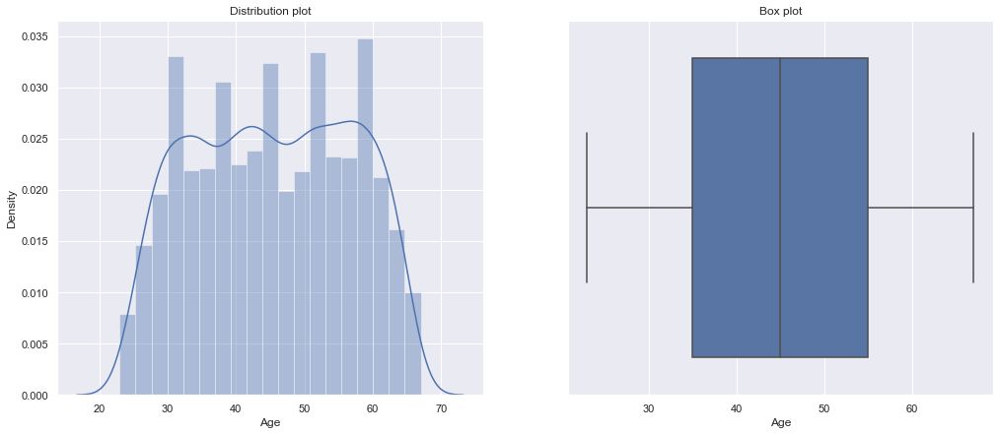

Total Number of outliers in Age: 0


In [852]:
univariate_analysis_boxplot_distplot(df, "Age")

**No outliers present here**

**The data is normally distributed and wider in middle**

**People with age between 35 to 65 are more**

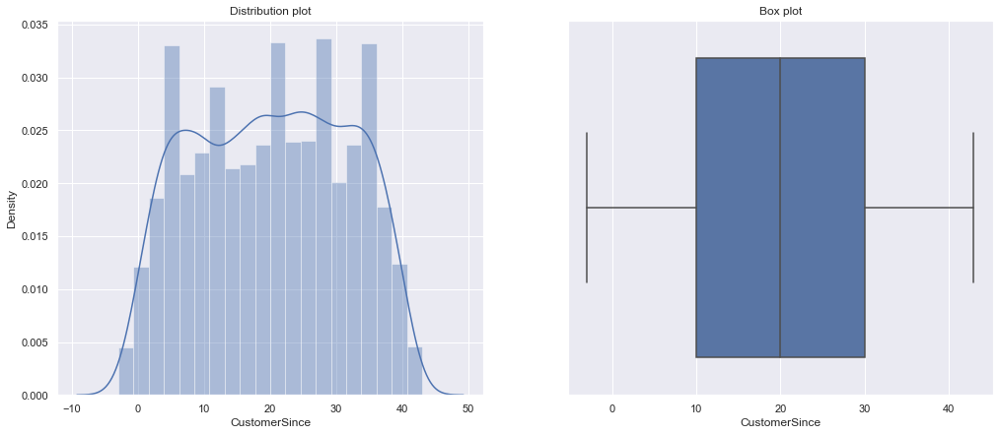

Total Number of outliers in CustomerSince: 0


In [853]:
univariate_analysis_boxplot_distplot(df, "CustomerSince")

**No outliers present here**

**The data is normally distributed and wider in middle**

**Most of the people became customer of bank between 10 to 30.**

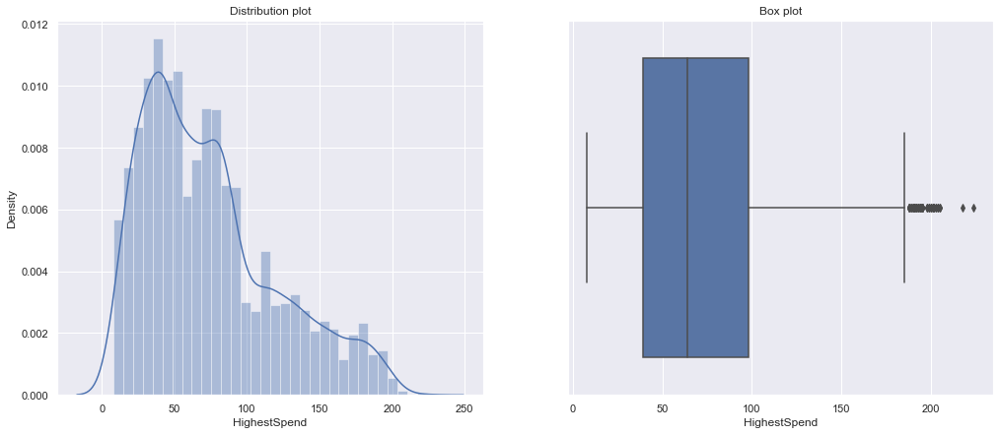

Total Number of outliers in HighestSpend: 96


In [854]:
univariate_analysis_boxplot_distplot(df, "HighestSpend")

**Here 96 outliers are present**

**Data is skewed positively**

**In one transaction highest spend amount is between 45 to 100. Fewer customer spend more than approx 200**

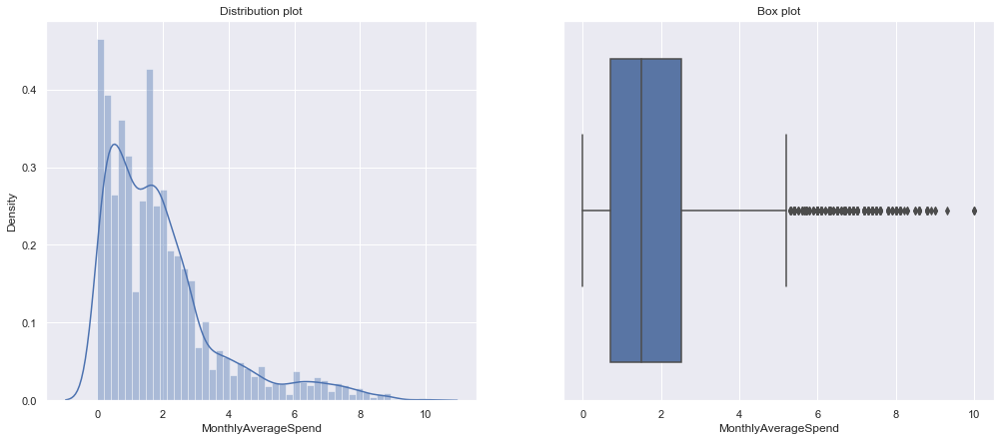

Total Number of outliers in MonthlyAverageSpend: 324


In [855]:
univariate_analysis_boxplot_distplot(df, "MonthlyAverageSpend")

**There are 324 outliers**

**Huge positive skewness is present**

**We can say that few customers spend hugely monthly with repect to others**

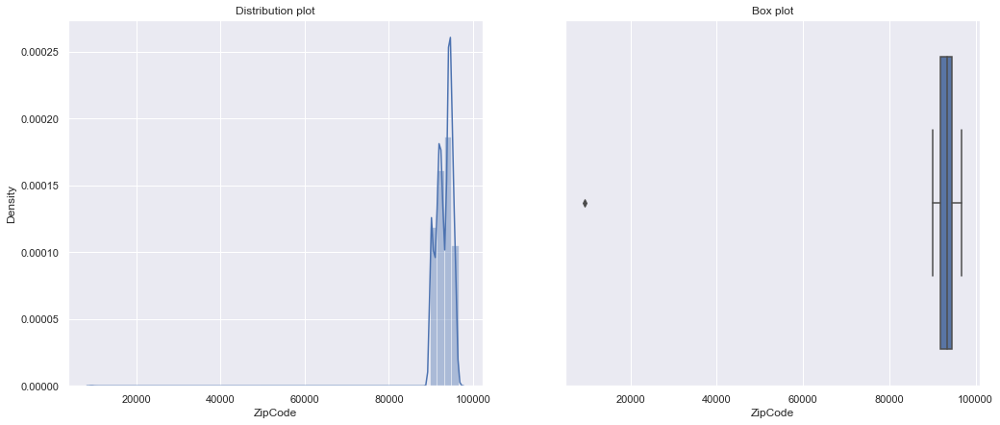

Total Number of outliers in ZipCode: 1


In [856]:
univariate_analysis_boxplot_distplot(df, "ZipCode")

**Most of the zipcodes are appeared once.**

**There is no proper distribution**

**This column does not add value to the model. We will drop during model building**

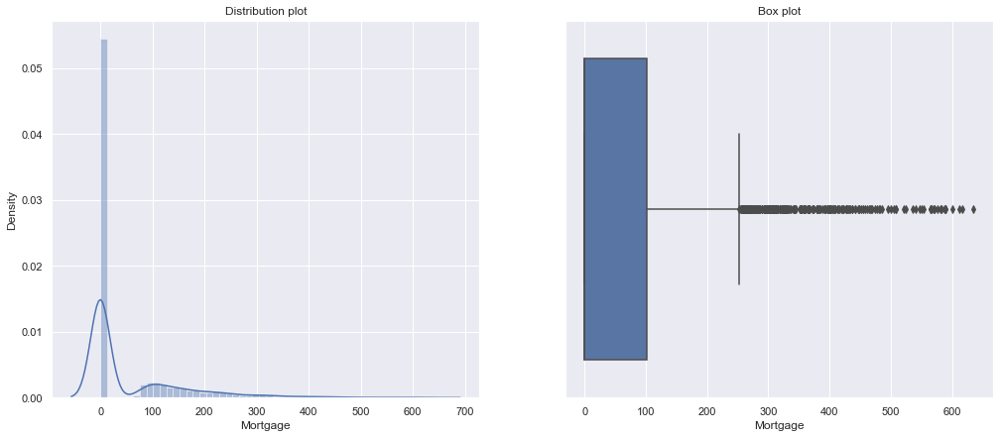

Total Number of outliers in Mortgage: 291


In [857]:
univariate_analysis_boxplot_distplot(df, "Mortgage")

**Most of the values are 0**

**There are huge outliers and distribution is not normal**

**We can say that most of the customers dont have mortgages**

In [858]:
def univariate_analysis_piechart_bargraph(dataset,criteria):
    f,axes=plt.subplots(1,2,figsize=(17,7))
    dataset[criteria].value_counts().plot.pie(autopct='%1.1f%%',ax=axes[0],shadow=True)
    sns.countplot(criteria,data=dataset,ax=axes[1])
    axes[0].set_title(f'{criteria} Variable Pie Chart')
    axes[1].set_title(f'{criteria} Variable Bar Graph')
    plt.show()

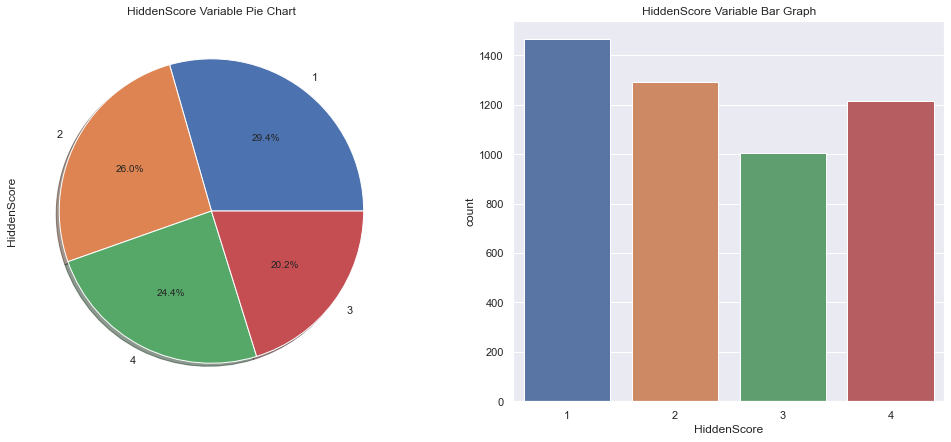

In [859]:
univariate_analysis_piechart_bargraph(df,"HiddenScore")

**Hidden score is almost equally distributed**

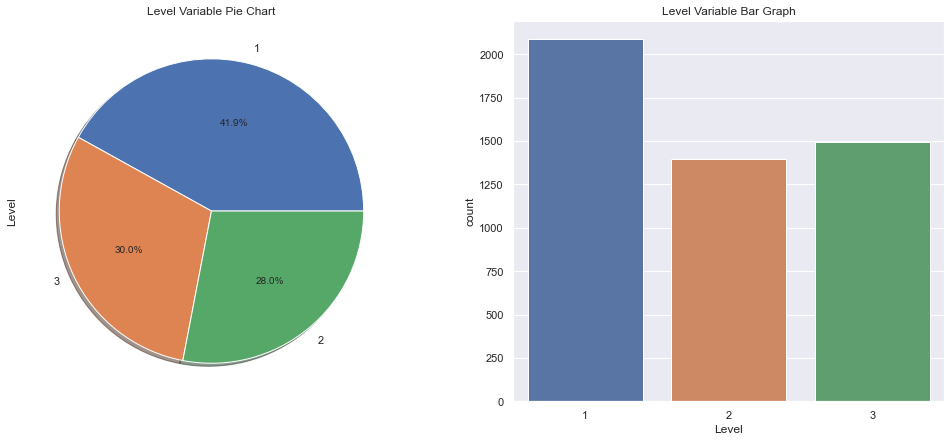

In [860]:
univariate_analysis_piechart_bargraph(df,"Level")

**Level 2 and 3 are almost equally distributed**

**Level 1 is slightly higher**

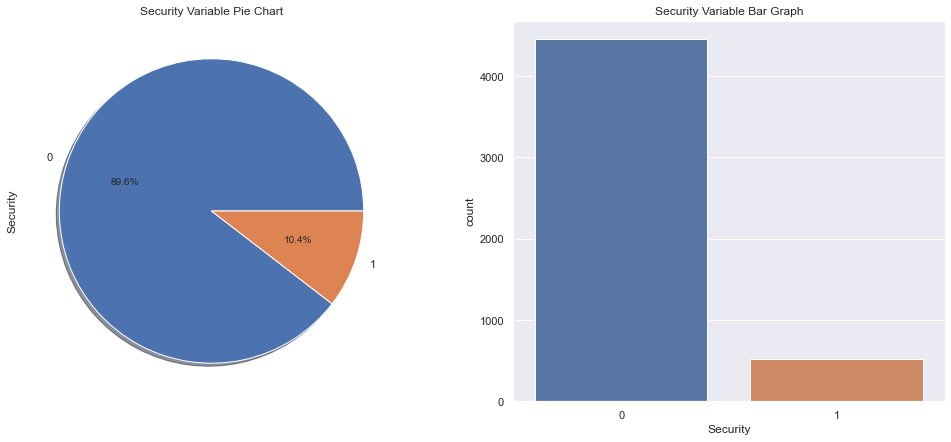

In [861]:
univariate_analysis_piechart_bargraph(df,"Security")

**89.6% customers dont have security**

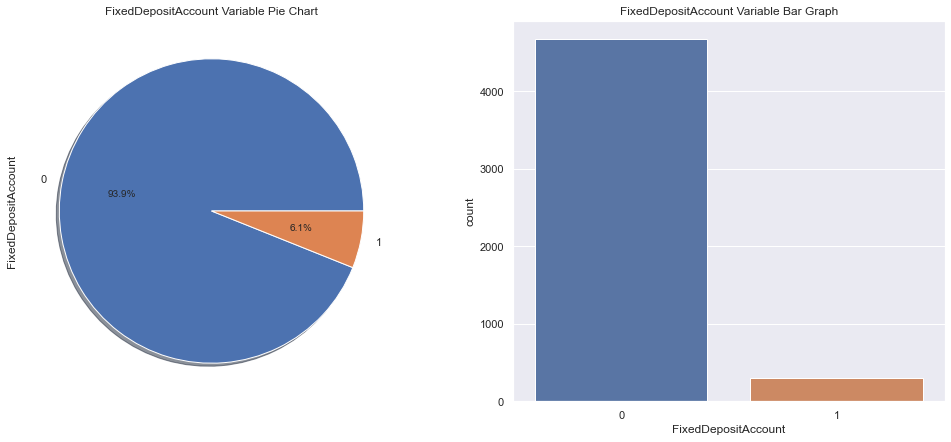

In [862]:
univariate_analysis_piechart_bargraph(df,"FixedDepositAccount")

**93.9 customers dont have Fixed deposit**

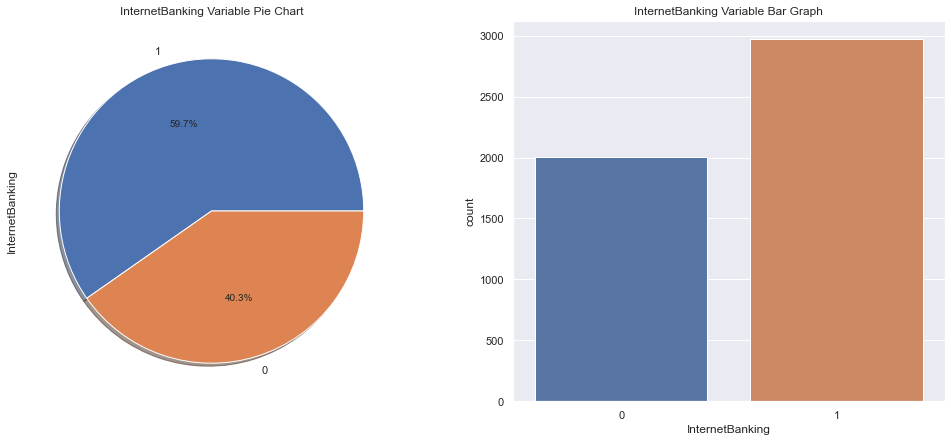

In [863]:
univariate_analysis_piechart_bargraph(df,"InternetBanking")

**Customer using internet banking are just slightly more than who are not**

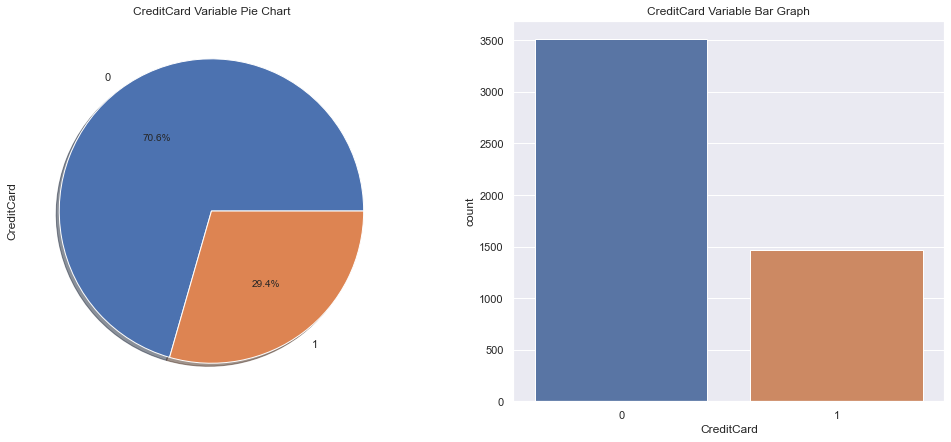

In [864]:
univariate_analysis_piechart_bargraph(df,"CreditCard")

**Only 29.4% of customer uses bank’s credit card.**

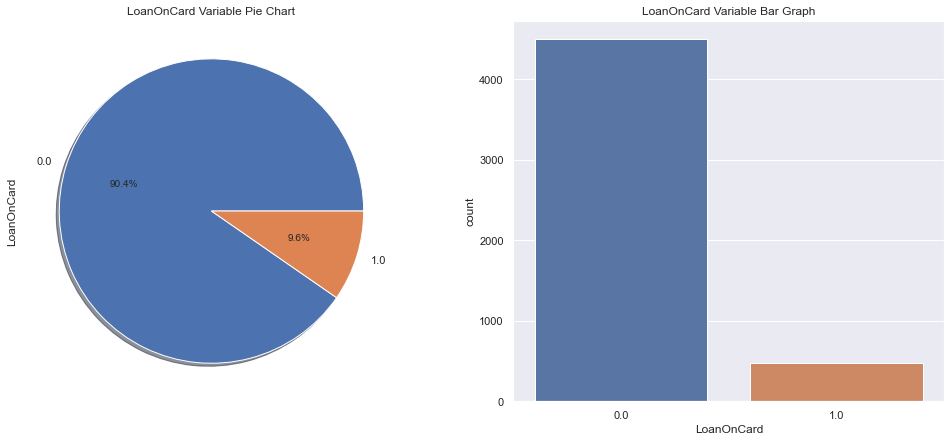

In [865]:
univariate_analysis_piechart_bargraph(df,"LoanOnCard")

**90% of customers does not have loan on credit card**

### Bi Variate Analysis

In [866]:
def bivariate_boxplot_bargraph(data,criteria, criteria2):
    f,axes=plt.subplots(1,2,figsize=(17,7))
    sns.boxplot(x=criteria, y=criteria2, data= data, ax=axes[0])
    sns.barplot(x=criteria, y=criteria2, data= data, ax=axes[1])
    axes[0].set_title(f'{criteria} Variable Pie Chart with hue {criteria2}')
    axes[1].set_title(f'{criteria} Variable Bar Graph  with hue {criteria2}')
    plt.show()

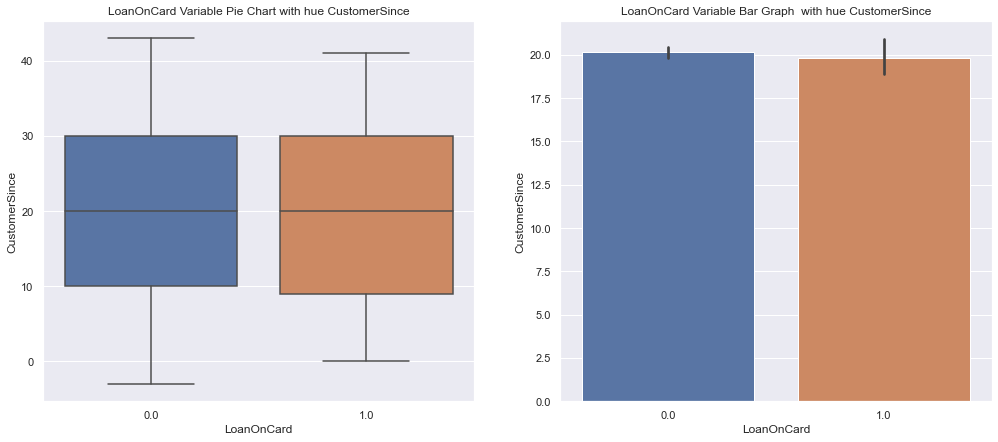

In [867]:
bivariate_boxplot_bargraph(df, "LoanOnCard", "CustomerSince")

**Customer with the bank since is equally distributed among loan holder and non-loan holder** 

**Mean values are nearly equal for both loan holders and non loan holders**

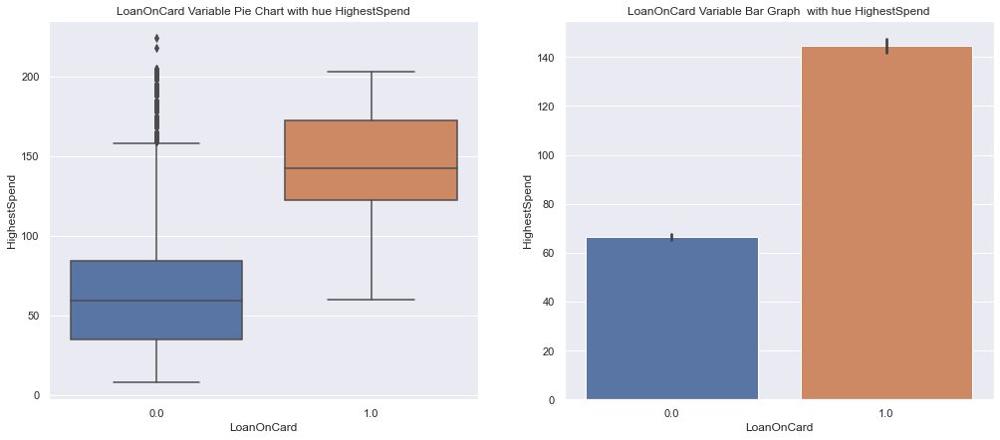

In [868]:
bivariate_boxplot_bargraph(df, "LoanOnCard", "HighestSpend")

**1. People without loan have lesser mean highest spend than people with loan(Box on loan category above box on non-loan category)**

**2. People without loan sometimes have more highest spend than people with loan(As we can see outlier in case of non-loan category)**

**3. Mean of highest spent is more for people with loan**

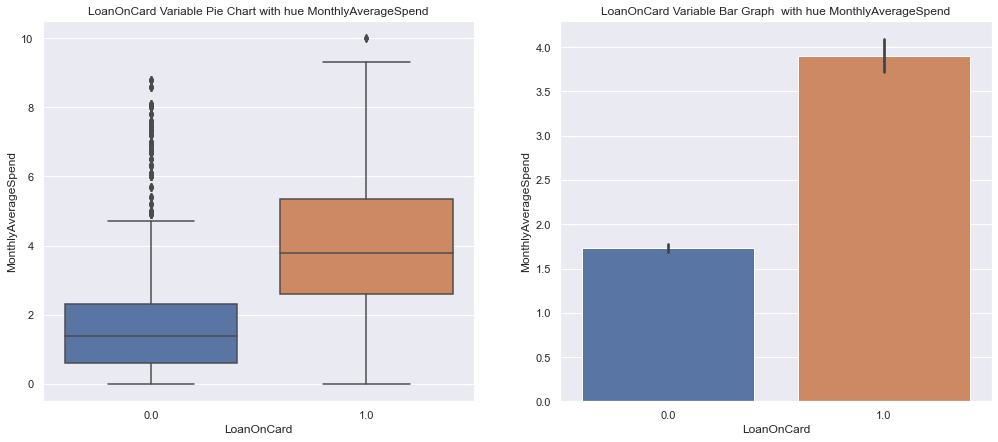

In [869]:
bivariate_boxplot_bargraph(df, "LoanOnCard", "MonthlyAverageSpend")

**1. People without loan have lesser mean monthly average spend than people with loan(Box on loan category above box on non-loan category)**

**2. People without loan sometimes(Outliers) have more monthly average spend than people with loan(As we can see outlier in case of non-loan category)**

**3. Mean of highest spent is more for people with loan**

**4. Graphically, the behavior of montly average spend is quite similar to highest spend compare to loan on card**

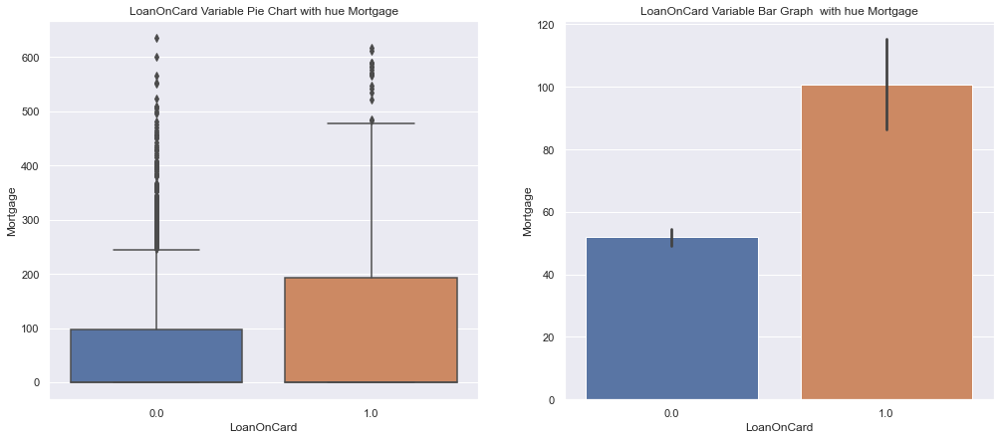

In [870]:
bivariate_boxplot_bargraph(df, "LoanOnCard", "Mortgage")

**1. There are outlier mortgages in case of both people with loan and without loan**

**2. Mortgages are higher for people with loan**

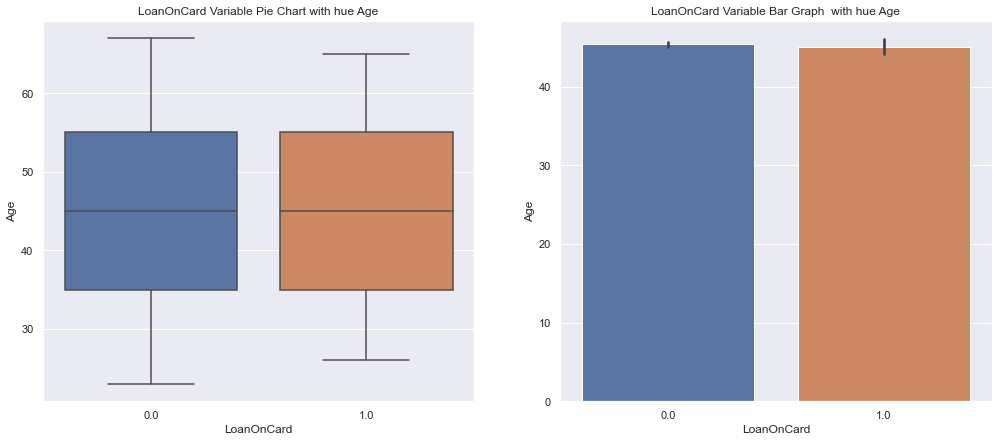

In [871]:
bivariate_boxplot_bargraph(df, "LoanOnCard", "Age")

**Age distribution is nearly equal for both loan holders and non-loan holders**

**Mean of age for both loan holders and non-loan holders is similar**

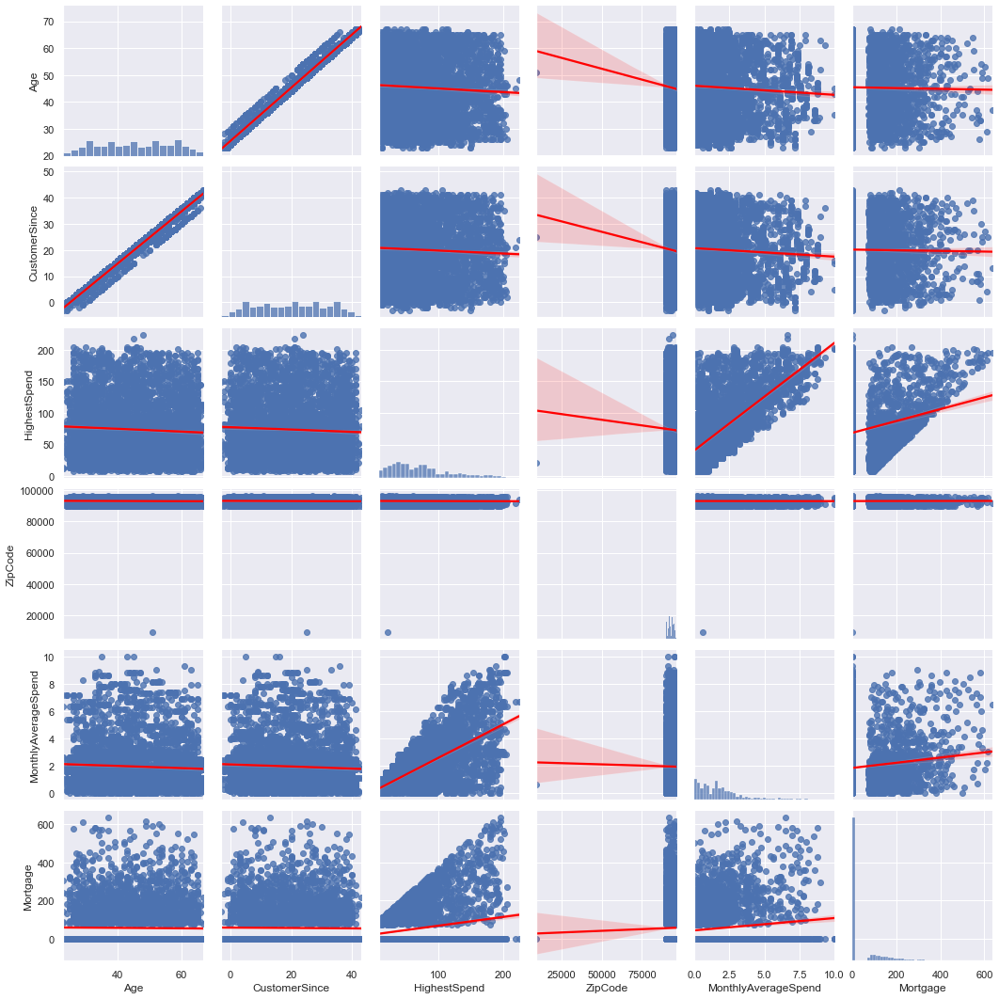

In [872]:
sns.pairplot(df,kind="reg", plot_kws={'line_kws':{'color':'red'}})

**1. We can see linear relationship between monthly average spend and Highest spend**

**2. Customer since and age are highly correlated**

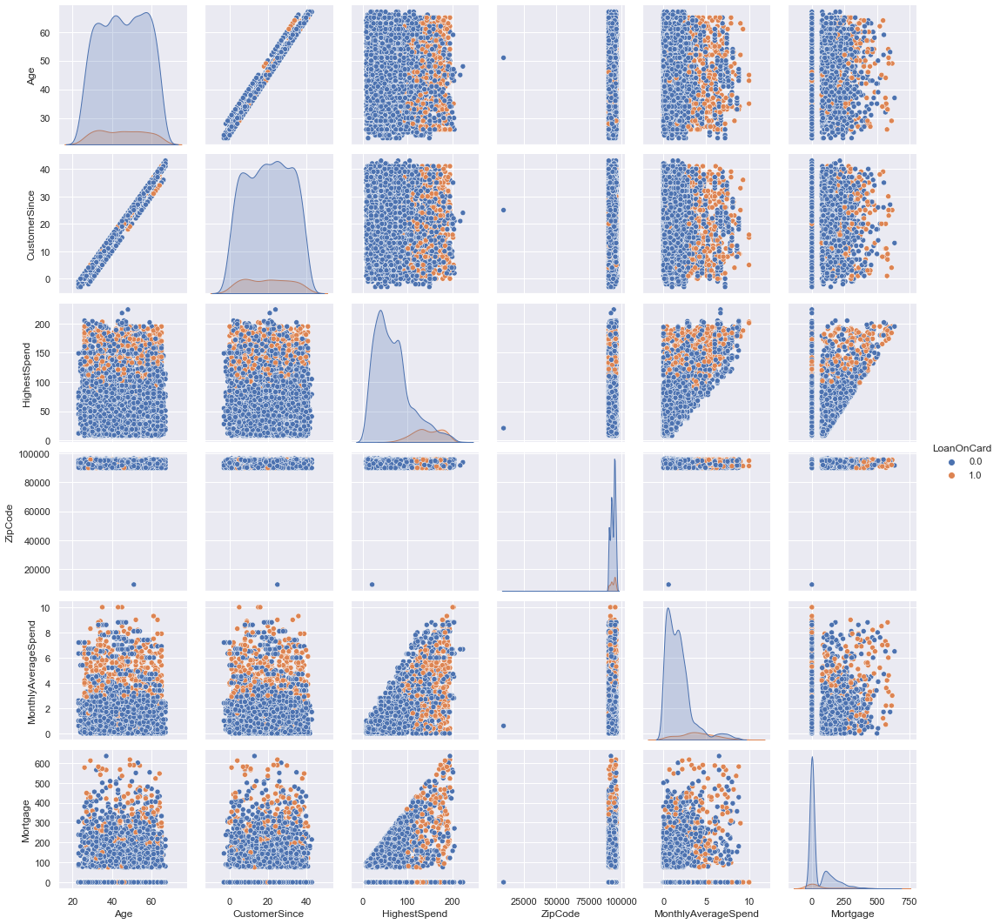

In [873]:
sns.pairplot(df, hue="LoanOnCard")

### Correlation among pairs of continuous variables

<AxesSubplot:>

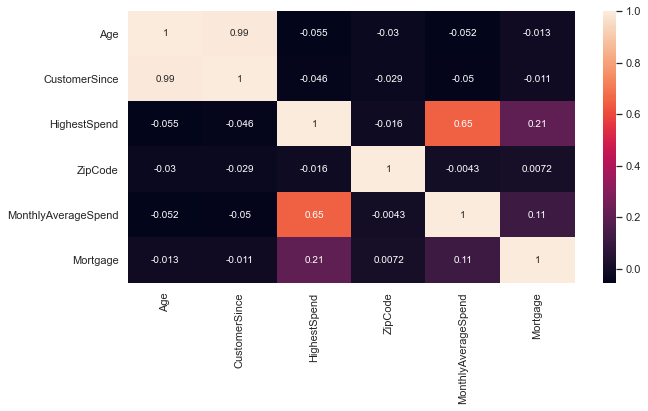

In [874]:
plt.figure(figsize=(10,5))
sns.heatmap(df.corr(), annot=True) 

**Age and customer since has correlation as 1. Any one can be used for the model.**

**Highest spend has high correlation with monthly average spend**

**Mortage and highest spend has little correlation**

**Rest of the variables does not have any relation**

<AxesSubplot:xlabel='HiddenScore', ylabel='count'>

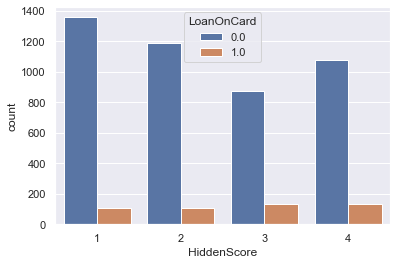

In [875]:
sns.countplot(df['HiddenScore'],hue=df['LoanOnCard'])


Hidden score is high for customer without loan

<AxesSubplot:xlabel='Level', ylabel='count'>

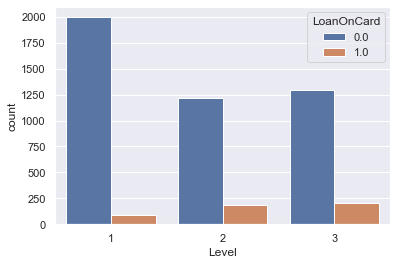

In [876]:
sns.countplot(df['Level'],hue=df['LoanOnCard'])


Level is high for customer without loan

<AxesSubplot:xlabel='Security', ylabel='count'>

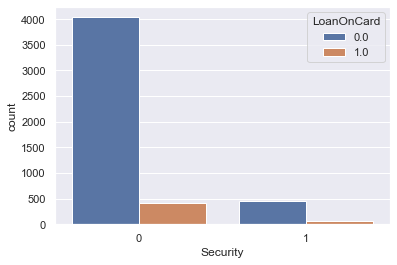

In [877]:
sns.countplot(df['Security'],hue=df['LoanOnCard'])


security is high for customer without loan

<AxesSubplot:xlabel='FixedDepositAccount', ylabel='count'>

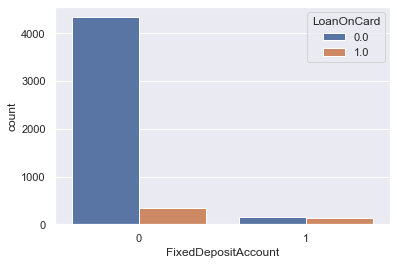

In [878]:
sns.countplot(df['FixedDepositAccount'],hue=df['LoanOnCard'])

People without fixed deposit are more and without loan

### Multivariate Analysis

<AxesSubplot:xlabel='Level', ylabel='MonthlyAverageSpend'>

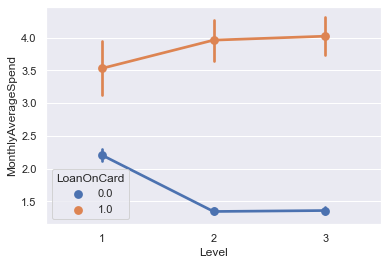

In [879]:
sns.pointplot(x="Level", y="MonthlyAverageSpend", hue = 'LoanOnCard',  data=df)

**We can clearly see that loan holder spend more money monthly.Particulary the spend is more on level 2 and 3**

<AxesSubplot:xlabel='InternetBanking', ylabel='MonthlyAverageSpend'>

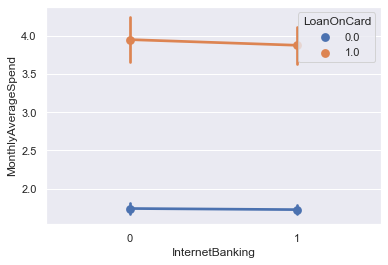

In [880]:
sns.pointplot(x="InternetBanking", y="MonthlyAverageSpend", hue = 'LoanOnCard',  data=df)

**Internet banking doesnt affect monthly spent as line is flat for both loan customer and non-loan customers**

<AxesSubplot:xlabel='CreditCard', ylabel='MonthlyAverageSpend'>

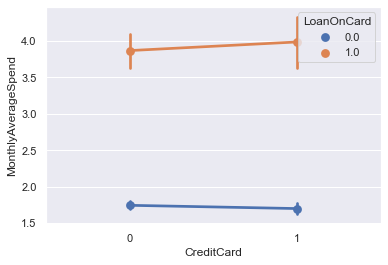

In [881]:
sns.pointplot(x="CreditCard", y="MonthlyAverageSpend", hue = 'LoanOnCard',  data=df)

**Montly average spendis slightly more for credit card holders for people with loan**

<AxesSubplot:xlabel='FixedDepositAccount', ylabel='MonthlyAverageSpend'>

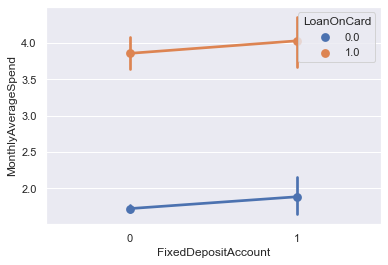

In [882]:
sns.pointplot(x="FixedDepositAccount", y="MonthlyAverageSpend", hue = 'LoanOnCard',  data=df)

### Hypothesis Testing
**We can check whether all the independent variables has significant effect on target variables**

In [883]:
df_summary=df.groupby('LoanOnCard') #getting mean values of each class for all independent variables
df_summary.mean().reset_index()

,LoanOnCard,Age,CustomerSince,HighestSpend,ZipCode,MonthlyAverageSpend,Mortgage
0,0.0,45.383111,20.146889,66.290444,93152.337111,1.729849,51.869111
1,1.0,45.066667,19.843750,144.745833,93153.202083,3.905354,100.845833


Highest Spend mean values differ huge for loan and non-loan customer

Age mean is equal for each class

**Hypothesis Testing of continuous feature with target variable**

In [884]:
col=list(df.select_dtypes(include=['int64','float64']).columns)

Here we will be using two-sample unpaired t-test

Ho(Null Hypothesis):There is no significant difference in independent feature with different category of Target variable

H1(Alternate Hypothesis):There is significant difference in independent feature with different category of Target variable

In [885]:
for i in col:
    x = np.array(df[df.LoanOnCard == 0][i]) 
    y = np.array(df[df.LoanOnCard == 1][i])
    t, p_value  = stats.ttest_ind(x,y, axis = 0,equal_var=False) 
    print('{} P_Value:{}'.format('\033[1m',p_value))
    if p_value < 0.05:  # Setting our significance level at 5%
        print('{} Rejecting Null Hypothesis.{} of Loan holders and non-Loan holders are not same'.format('\033[1m',i))
    else:
        print('{} Fail to Reject Null Hypothesis.{} of Loan holders and non-Loan holders are  same'.format('\033[1m',i))
    print('\n')

 P_Value:0.5694160158774422
 Fail to Reject Null Hypothesis.Age of Loan holders and non-Loan holders are  same


 P_Value:0.5855242526574542
 Fail to Reject Null Hypothesis.CustomerSince of Loan holders and non-Loan holders are  same


 P_Value:1.527529731162187e-227
 Rejecting Null Hypothesis.HighestSpend of Loan holders and non-Loan holders are not same


 P_Value:0.9920253364424511
 Fail to Reject Null Hypothesis.ZipCode of Loan holders and non-Loan holders are  same


 P_Value:2.414409993123105e-77
 Rejecting Null Hypothesis.MonthlyAverageSpend of Loan holders and non-Loan holders are not same


 P_Value:1.3389598194359617e-10
 Rejecting Null Hypothesis.Mortgage of Loan holders and non-Loan holders are not same




**We can see Age,Customer since and zip code does not have effect on target variable. So dropping this column before building model**

In [886]:
df.drop(['Age','CustomerSince','ZipCode'],axis=1,inplace=True)

### Statistical Testing of categorical features with target variable

Ho: There is no significant difference in hidden score for different category of target variable(Loan on card)

H1: There is significant difference in hidden score for different category of target variable(Loan on card)

In [887]:
crosstab=pd.crosstab(df['LoanOnCard'],df['HiddenScore'])
print(crosstab)

HiddenScore     1     2    3     4
LoanOnCard                        
0.0          1359  1187  873  1081
1.0           107   106  133   134


In [888]:
chi,p_value,dof,expected=stats.chi2_contingency(crosstab)
print('P_Value:', p_value)
if p_value < 0.05:  # Setting our significance level at 5%
    print('{} Rejecting Null Hypothesis. \n There is significant difference in hidden score for different category of target variable(Loan on card)'.format('\033[1m'))
else:
    print('{} Fail to Reject Null Hypothesis.\n There is no significant difference in hidden score for different category of target variable(Loan on card)'.format('\033[1m'))

P_Value: 1.5107064617649127e-06
 Rejecting Null Hypothesis. 
 There is significant difference in hidden score for different category of target variable(Loan on card)


In [889]:
cat_col=list(df.select_dtypes(include=['category']).columns)

In [890]:
cat_col.remove('HiddenScore')
cat_col.remove('LoanOnCard')

In [891]:
for i in cat_col:
    crosstab=pd.crosstab(df['LoanOnCard'],df[i])
    chi,p_value,dof,expected=stats.chi2_contingency(crosstab)
    if p_value < 0.05:  # Setting our significance level at 5%
        print('{} Rejecting Null Hypothesis. \n There is significant difference in {} Feature for different category of target variable(Loan on card)'.format('\033[1m',i))
    else:
        print('{} Fail to Reject Null Hypothesis.\n There is no significant difference in {} Feature for different category of target variable(Loan on card)'.format('\033[1m',i))
    print('\n')

 Rejecting Null Hypothesis. 
 There is significant difference in Level Feature for different category of target variable(Loan on card)


 Fail to Reject Null Hypothesis.
 There is no significant difference in Security Feature for different category of target variable(Loan on card)


 Rejecting Null Hypothesis. 
 There is significant difference in FixedDepositAccount Feature for different category of target variable(Loan on card)


 Fail to Reject Null Hypothesis.
 There is no significant difference in InternetBanking Feature for different category of target variable(Loan on card)


 Fail to Reject Null Hypothesis.
 There is no significant difference in CreditCard Feature for different category of target variable(Loan on card)




**We can see credit card,internet banking and security does not have significant difference in target variable.So dropping this column before building model**

In [892]:
df.drop(['CreditCard','InternetBanking','Security'],axis=1,inplace=True)

**Montly average spend is slightly more for FD Account holders in both cases of loan**

## Data pre-processing:
**• Segregate predictors vs target attributes**

**• Check for target balancing and fix it if found imbalanced.**

**• Perform train-test split.**

In [893]:
col=['HighestSpend','MonthlyAverageSpend','Mortgage']
for c in col:
    #getting upper lower quartile values
    q25,q75=np.percentile(df[c],25),np.percentile(df[c],75)
    IQR=q75-q25
    Threshold=IQR*1.5
    lower,upper=q25-Threshold,q75+Threshold
    Outliers=[i for i in df[c] if i < lower or i > upper]
    print('{} Total Number of outliers in {} Before Imputing : {}'.format('\033[1m',c,len(Outliers)))
    print('\n')
    #taking mean of a column without considering outliers
    df_include = df.loc[(df[c] >= lower) & (df[c] <= upper)]
    mean=int(df_include[c].mean())
    print('{} Mean of {} is {}'.format('\033[1m',c,mean))
    print('\n')
    #imputing outliers with mean
    df[c]=np.where(df[c]>upper,mean,df[c])
    df[c]=np.where(df[c]<lower,mean,df[c])
    Outliers=[i for i in df[c] if i < lower or i > upper]
    print('{} Total Number of outliers in {} After Imputing : {}'.format('\033[1m',c,len(Outliers)))  
    print('\n')

 Total Number of outliers in HighestSpend Before Imputing : 96


 Mean of HighestSpend is 71


 Total Number of outliers in HighestSpend After Imputing : 0


 Total Number of outliers in MonthlyAverageSpend Before Imputing : 324


 Mean of MonthlyAverageSpend is 1


 Total Number of outliers in MonthlyAverageSpend After Imputing : 0


 Total Number of outliers in Mortgage Before Imputing : 291


 Mean of Mortgage is 38


 Total Number of outliers in Mortgage After Imputing : 0




**Segregate predictors vs target attributes**

In [894]:
x=df.drop(columns='LoanOnCard')
y=df['LoanOnCard'] #target

In [895]:
x.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4980 entries, 9 to 4999
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   HighestSpend         4980 non-null   int64   
 1   HiddenScore          4980 non-null   category
 2   MonthlyAverageSpend  4980 non-null   float64 
 3   Level                4980 non-null   category
 4   Mortgage             4980 non-null   int64   
 5   FixedDepositAccount  4980 non-null   category
dtypes: category(3), float64(1), int64(2)
memory usage: 299.7 KB


**• Check for target balancing and fix it if found imbalanced.**

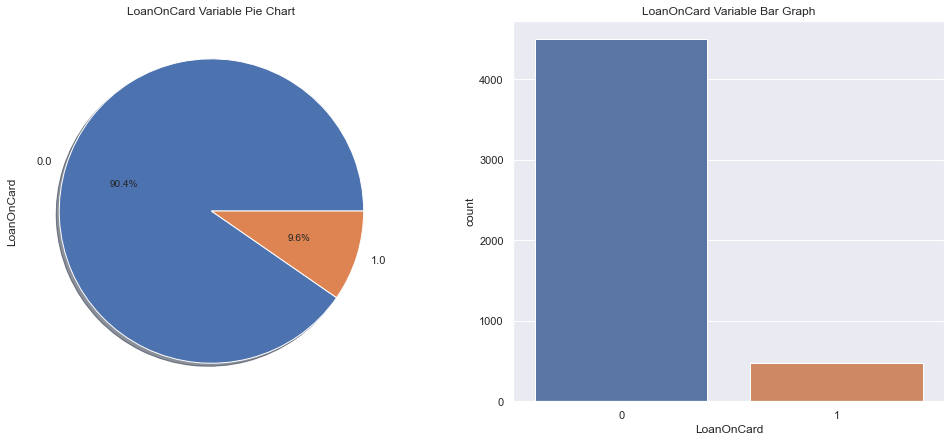

In [896]:
f,axes=plt.subplots(1,2,figsize=(17,7))
df['LoanOnCard'].value_counts().plot.pie(autopct='%1.1f%%',ax=axes[0],shadow=True)
sns.countplot('LoanOnCard',data=df,ax=axes[1],order=[0,1])
axes[0].set_title('LoanOnCard Variable Pie Chart')
axes[1].set_title('LoanOnCard Variable Bar Graph')
plt.show()

**As we can see in graph, There is huge imbalance in target variable.**

**If the imbalanced data is not treated beforehand, then this will degrade the performance of the classifier model. Most of the predictions will correspond to the majority class and treat the minority class features as noise in the data and ignore them. This will result in a high bias in the model.**



**• Check for target balancing and fix it if found imbalanced.**

In [897]:
smote_nc=SMOTENC(categorical_features=[1,3,5],random_state=42) #specifying categorical column numbers
x_s,y_s=smote_nc.fit_resample(x,y)

In [898]:
print('Before sampling:')
print(y.value_counts())

Before sampling:
0.0    4500
1.0     480
Name: LoanOnCard, dtype: int64


In [899]:
print('Before sampling:')
print(y_s.value_counts())

Before sampling:
0.0    4500
1.0    4500
Name: LoanOnCard, dtype: int64


**• Perform train-test split.**

**Non-Sampled Data split**

In [900]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=10)

**Sampled Data split**

In [901]:
#Sampled test Data
X_train_s, X_test_s, y_train_s, y_test_s = train_test_split(x_s, y_s, test_size=0.30, random_state=10)

## 5. Model training, testing and tuning:
**• Design and train a Logistic regression and Naive Bayes classifiers.**

**• Display the classification accuracies for train and test data.**

**• Display and explain the classification report in detail.**

**• Apply all the possible tuning techniques to train the best model for the given data. Select the final best trained model with your comments for selecting this model.**

In [902]:
def logisticRegressionAnalysis(x_train,y_train,x_test,y_test):
    # Fit the model on train
    logreg = LogisticRegression()
    ############################################################################################
    # Design and train a logistic regression
    ############################################################################################

    logreg.fit(x_train, y_train)
    prediction = logreg.predict(x_test)
    print('Prediction: {}'.format(prediction))

    ############################################################################################
    # Display the classification accuracies for train and test data.
    ############################################################################################

    print('With logistic regression accuracy of train data is: ',logreg.score(x_train,y_train)) # accuracy
    print('With logistic regression accuracy of test data is: ',logreg.score(x_test,y_test)) # accuracy


    ############################################################################################
    #Display and explain the classification report in detail.
    ############################################################################################

    # Confusion Matrix
    cm = confusion_matrix(y_test, prediction, labels=[0, 1])

    df_cm = pd.DataFrame(cm, index = [i for i in ["Non-Loan holders","Loan holders"]],
                      columns = [i for i in ["Non-Loan holders","Loan holders"]])
    plt.figure(figsize = (7,5))
    sns.heatmap(df_cm, annot=True ,fmt='g')
    plt.show()


    # Classification Report
    print('\n{}'.format(classification_report(y_test, prediction)))


Prediction: [1. 0. 1. ... 0. 0. 0.]
With logistic regression accuracy of train data is:  0.9506597819850832
With logistic regression accuracy of test data is:  0.9424364123159303


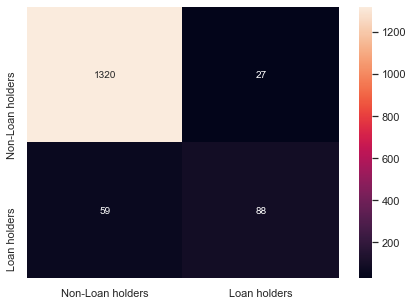


              precision    recall  f1-score   support

         0.0       0.96      0.98      0.97      1347
         1.0       0.77      0.60      0.67       147

    accuracy                           0.94      1494
   macro avg       0.86      0.79      0.82      1494
weighted avg       0.94      0.94      0.94      1494



In [903]:
#before sampling
logisticRegressionAnalysis(X_train,y_train,X_test,y_test)

### Inference on Logistic regression before sampling

**Before Sampling**

95% accuracy on training set and 94% accuracy on test set.

Here training set accuracy and testing accuracy are balanced when model is built without sampling also accuracy is good

In the above confusion matrix 59 and 27 are the errors in the model.

Here you can see model is poor in predicting class 1 compared to class 0

Accuracy is good but in this case we need to look on recall value

Here Recall tells that only 60% class 1 is predicted correctly from actual values

We dont have enough sample of class 1 to train the model.

We will do the sampling and check how recall values improves in this case.

Prediction: [1. 1. 1. ... 0. 1. 0.]
With logistic regression accuracy of train data is:  0.8750793650793651
With logistic regression accuracy of test data is:  0.8818518518518519


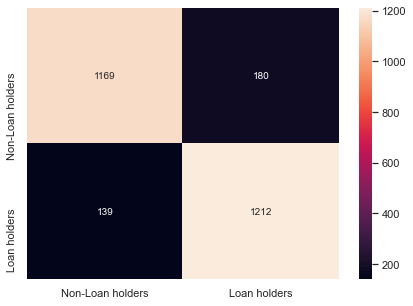


              precision    recall  f1-score   support

         0.0       0.89      0.87      0.88      1349
         1.0       0.87      0.90      0.88      1351

    accuracy                           0.88      2700
   macro avg       0.88      0.88      0.88      2700
weighted avg       0.88      0.88      0.88      2700



In [904]:
#After sampling
logisticRegressionAnalysis(X_train_s,y_train_s,X_test_s,y_test_s)

### Inference on Logistic regression after sampling

**After Sampling :**

Here both accuracy is reduced after sampling. Let us check on the classification report.

Now we can see recall value is improved after sampling.

So the imbalanced target we used sampling method to balance the data.

f1 score here has decreased as the data is more balanced now. Due to imbalanced data class one is considered as noise.

Here we can see macro avg and weighted avg as similar which is good depicting balanced data.

### NaiveBayes

In [905]:
def NaiveBayesAnalysis(x_train,y_train,x_test,y_test):
    # Fit the model on train
    nb = GaussianNB()
    ############################################################################################
    # Design and train a NaiveBayes
    ############################################################################################

    nb.fit(x_train, y_train)
    prediction = nb.predict(x_test)
    print('Prediction: {}'.format(prediction))

    ############################################################################################
    # Display the classification accuracies for train and test data.
    ############################################################################################

    print('With logistic regression accuracy of train data is: ',nb.score(x_train,y_train)) # accuracy
    print('With logistic regression accuracy of test data is: ',nb.score(x_test,y_test)) # accuracy


    ############################################################################################
    #Display and explain the classification report in detail.
    ############################################################################################

    # Confusion Matrix
    cm = confusion_matrix(y_test, prediction, labels=[0, 1])

    df_cm = pd.DataFrame(cm, index = [i for i in ["Non-Loan holders","Loan holders"]],
                      columns = [i for i in ["Non-Loan holders","Loan holders"]])
    plt.figure(figsize = (7,5))
    sns.heatmap(df_cm, annot=True ,fmt='g')
    plt.show()


    # Classification Report
    print('\n{}'.format(classification_report(y_test, prediction)))

Prediction: [1. 0. 0. ... 0. 1. 0.]
With logistic regression accuracy of train data is:  0.9104991394148021
With logistic regression accuracy of test data is:  0.9022757697456493


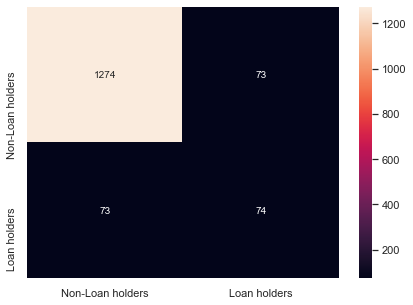


              precision    recall  f1-score   support

         0.0       0.95      0.95      0.95      1347
         1.0       0.50      0.50      0.50       147

    accuracy                           0.90      1494
   macro avg       0.72      0.72      0.72      1494
weighted avg       0.90      0.90      0.90      1494



In [906]:
#Before Sampling
NaiveBayesAnalysis(X_train,y_train,X_test,y_test)

### Inference on NaiveBayes before sampling

Here accuracy in test data slightly less compared to training data.

Recall value is bad for class 1

Recall value for class 1 is less in naive bayes model compared to logistic regression.



Prediction: [1. 1. 1. ... 0. 1. 0.]
With logistic regression accuracy of train data is:  0.8539682539682539
With logistic regression accuracy of test data is:  0.8611111111111112


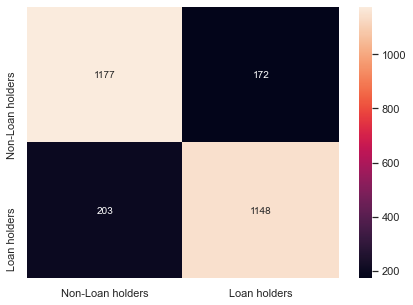


              precision    recall  f1-score   support

         0.0       0.85      0.87      0.86      1349
         1.0       0.87      0.85      0.86      1351

    accuracy                           0.86      2700
   macro avg       0.86      0.86      0.86      2700
weighted avg       0.86      0.86      0.86      2700



In [907]:
#After Sampling
NaiveBayesAnalysis(X_train_s,y_train_s,X_test_s,y_test_s)

### Inference on NaiveBayes after sampling

Here accuracy in test data slightly less compared to training data.

Recall value is good for both classes

Recall value for class 1 is less in naive bayes model compared to logistic regression.

Perceision and f1 score is also lesser compared to logistic regression

In [908]:
def KNNAnalysis(x_train,y_train,x_test,y_test,n=4):
    # Fit the model on train
    KNN = KNeighborsClassifier(n_neighbors=n)
    ############################################################################################
    # Design and train a KNN
    ############################################################################################

    KNN.fit(x_train, y_train)
    prediction = KNN.predict(x_test)
    print('Prediction: {}'.format(prediction))

    ############################################################################################
    # Display the classification accuracies for train and test data.
    ############################################################################################

    print('With logistic regression accuracy of train data is: ',KNN.score(x_train,y_train)) # accuracy
    print('With logistic regression accuracy of test data is: ',KNN.score(x_test,y_test)) # accuracy


    ############################################################################################
    #Display and explain the classification report in detail.
    ############################################################################################

    # Confusion Matrix
    cm = confusion_matrix(y_test, prediction, labels=[0, 1])

    df_cm = pd.DataFrame(cm, index = [i for i in ["Non-Loan holders","Loan holders"]],
                      columns = [i for i in ["Non-Loan holders","Loan holders"]])
    plt.figure(figsize = (7,5))
    sns.heatmap(df_cm, annot=True ,fmt='g')
    plt.show()


    # Classification Report
    print('\n{}'.format(classification_report(y_test, prediction)))

Prediction: [0. 0. 0. ... 0. 0. 0.]
With logistic regression accuracy of train data is:  0.9558232931726908
With logistic regression accuracy of test data is:  0.9377510040160643


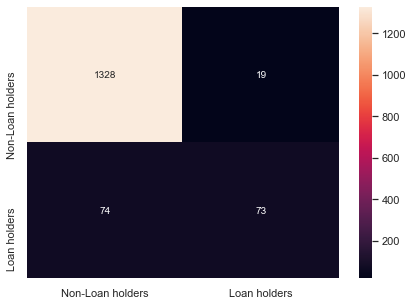


              precision    recall  f1-score   support

         0.0       0.95      0.99      0.97      1347
         1.0       0.79      0.50      0.61       147

    accuracy                           0.94      1494
   macro avg       0.87      0.74      0.79      1494
weighted avg       0.93      0.94      0.93      1494



In [909]:
#Before Sampling
KNNAnalysis(X_train,y_train,X_test,y_test,n=5)

Prediction: [1. 1. 1. ... 0. 1. 0.]
With logistic regression accuracy of train data is:  0.9704761904761905
With logistic regression accuracy of test data is:  0.945925925925926


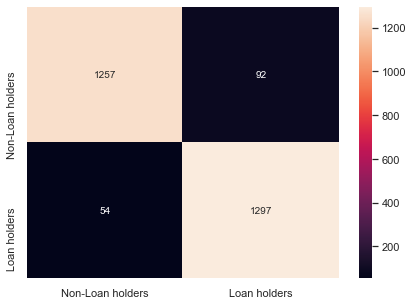


              precision    recall  f1-score   support

         0.0       0.96      0.93      0.95      1349
         1.0       0.93      0.96      0.95      1351

    accuracy                           0.95      2700
   macro avg       0.95      0.95      0.95      2700
weighted avg       0.95      0.95      0.95      2700



In [910]:
#After Sampling
KNNAnalysis(X_train_s,y_train_s,X_test_s,y_test_s,n=3)

### Inference on KNN 

Here accuracy in test data slightly less compared to training data. We have got best accuracy among the models till now.

Recall value is good for both classes

Recall value is more than previous models used.

Perceision and f1 score is also greater than previous models

In [911]:
def knn_optimization(x_train,y_train,x_test,y_test):
    neigbor = np.arange(1, 30)
    train_accuracy = []
    test_accuracy = []
    # Loop over different values of k
    for i, k in enumerate(neigbor):
        # k from 1 to 25(exclude)
        knn = KNeighborsClassifier(n_neighbors=k)
        # Fit with knn
        knn.fit(x_train,y_train)
        #train accuracy
        train_accuracy.append(knn.score(x_train, y_train))
        # test accuracy
        test_accuracy.append(knn.score(x_test, y_test))

    # Plot
    plt.figure(figsize=[13,8])
    plt.plot(neigbor, test_accuracy, label = 'Testing Accuracy')
    plt.plot(neigbor, train_accuracy, label = 'Training Accuracy')
    plt.legend()
    plt.title('-value VS Accuracy')
    plt.xlabel('Number of Neighbors')
    plt.ylabel('Accuracy')
    plt.xticks(neigbor)
    plt.savefig('graph.png')
    plt.show()
    print("Best accuracy is {} with K = {}".format(np.max(test_accuracy),1+test_accuracy.index(np.max(test_accuracy))))

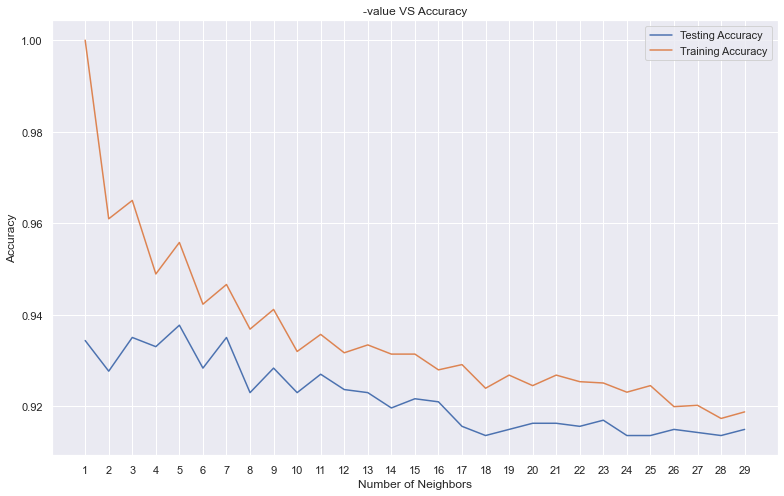

Best accuracy is 0.9377510040160643 with K = 5


In [912]:
#Before Sampling
knn_optimization(X_train,y_train,X_test,y_test)

**Since K=1 will be over fitting the model, we will take next best K i.e. 5**

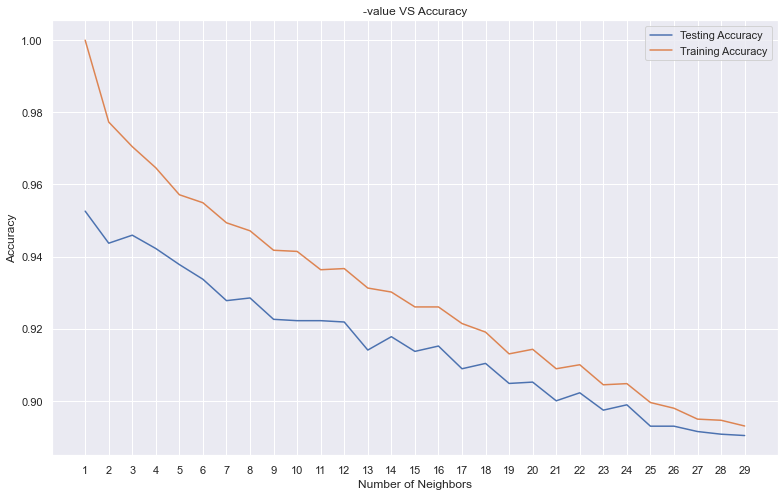

Best accuracy is 0.9525925925925925 with K = 1


In [913]:
#After Sampling
knn_optimization(X_train_s,y_train_s,X_test_s,y_test_s)

**Since K=1 will be over fitting the model, we will take next best K i.e. 3**

In [914]:
def SVMAnalysis(x_train,y_train,x_test,y_test,n=4):
    # Fit the model on train
    clf = svm.SVC(gamma=0.025, C=3)     
    ############################################################################################
    # Design and train a SVM
    ############################################################################################

    clf.fit(x_train, y_train)
    prediction = clf.predict(x_test)
    print('Prediction: {}'.format(prediction))

    ############################################################################################
    # Display the classification accuracies for train and test data.
    ############################################################################################

    print('With logistic regression accuracy of train data is: ',clf.score(x_train,y_train)) # accuracy
    print('With logistic regression accuracy of test data is: ',clf.score(x_test,y_test)) # accuracy


    ############################################################################################
    #Display and explain the classification report in detail.
    ############################################################################################

    # Confusion Matrix
    cm = confusion_matrix(y_test, prediction, labels=[0, 1])

    df_cm = pd.DataFrame(cm, index = [i for i in ["Non-Loan holders","Loan holders"]],
                      columns = [i for i in ["Non-Loan holders","Loan holders"]])
    plt.figure(figsize = (7,5))
    sns.heatmap(df_cm, annot=True ,fmt='g')
    plt.show()


    # Classification Report
    print('\n{}'.format(classification_report(y_test, prediction)))

Prediction: [0. 0. 0. ... 0. 0. 0.]
With logistic regression accuracy of train data is:  0.9753298909925416
With logistic regression accuracy of test data is:  0.9477911646586346


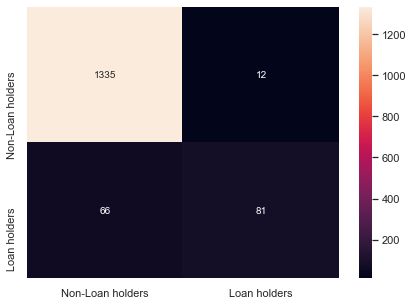


              precision    recall  f1-score   support

         0.0       0.95      0.99      0.97      1347
         1.0       0.87      0.55      0.67       147

    accuracy                           0.95      1494
   macro avg       0.91      0.77      0.82      1494
weighted avg       0.94      0.95      0.94      1494



In [915]:
SVMAnalysis(X_train,y_train,X_test,y_test)

Prediction: [1. 1. 1. ... 1. 1. 0.]
With logistic regression accuracy of train data is:  0.9623809523809523
With logistic regression accuracy of test data is:  0.9437037037037037


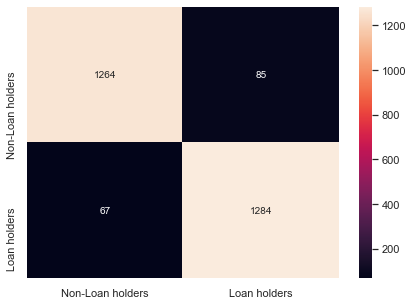


              precision    recall  f1-score   support

         0.0       0.95      0.94      0.94      1349
         1.0       0.94      0.95      0.94      1351

    accuracy                           0.94      2700
   macro avg       0.94      0.94      0.94      2700
weighted avg       0.94      0.94      0.94      2700



In [916]:
SVMAnalysis(X_train_s,y_train_s,X_test_s,y_test_s)

### Inference on SVM 

Here accuracy in test data slightly less compared to training data. We have got best accuracy among the models till now.

Recall value is good for both classes

Recall value is similar to KNN.

Percision and f1 score is also similar to KNN

In [917]:
def SVM_optimization(X_train, y_train, X_test, y_test):
    best_score=0
    gammas=[0.001, 0.01, 0.1, 1, 10]
    Cs=[0.001, 0.01, 0.1, 1, 10]
    kernels=['rbf', 'linear']
    
    for gamma in gammas:
        for C in Cs:
            for kernel in kernels:
                clf=svm.SVC(kernel=kernel,gamma=gamma, C=C)
                clf.fit(X_train, y_train)
                
                score=clf.score(X_test, y_test)

                if score>best_score:
                    y_pred=clf.predict(X_test)
                    best_score=score
                    best_params={'kernel':kernel, 'C':C, 'gamma':gamma}
        
    print("best score:",best_score)
    print("best params:",best_params)
    print("classification reports:\n",classification_report(y_test, y_pred))
    
SVM_optimization(X_train_s,y_train_s,X_test_s,y_test_s)

best score: 0.9574074074074074
best params: {'kernel': 'rbf', 'C': 10, 'gamma': 0.1}
classification reports:
               precision    recall  f1-score   support

         0.0       0.96      0.95      0.96      1349
         1.0       0.95      0.96      0.96      1351

    accuracy                           0.96      2700
   macro avg       0.96      0.96      0.96      2700
weighted avg       0.96      0.96      0.96      2700



### Inference on SVM after optimization

We have got best accuracy among the models till now i.e. 95.74.

Recall(0.96) value is best till now

Perceision(0.96) and f1(0.96) score is best till now.

## 6. Conclusion and improvisation:
    • Write your conclusion on the results.
    • Detailed suggestions or improvements or on quality, quantity, variety, velocity, veracity etc. on the data points collected by the
    bank to perform a better data analysis in future.

**Conclusion:**

Reference: 

**Precision:** When it predicts the positive result, how often is it correct? i.e. limit the number of false positives.

**Recall:** When it is actually the positive result, how often does it predict correctly? i.e. limit the number of false negatives.

**f1-score:** Harmonic mean of precision and recall.


| Model | precision(macro) | recall(macro) | f1-score(macro) |  precision-weighted |  recall-weighted |  f1-score-weighted | Accuracy |  |
| --- | --- | --- | --- | --- | --- | --- | --- | --- |
| Logistic regression without sampling |  0.86 | 0.79 |  0.82 | 0.94 | 0.94 | 0.94 | 94.24 |
| Logistic regression with sampling |  0.88 | 0.88 | 0.88 | 0.88 | 0.88 | 0.88 | 88.18 |  | 
| Naive Bayes without sampling | 0.72 | 0.72 | 0.72 | 0.90 | 0.90 | 0.90 | 90.22 | 
| Naive Bayes with sampling | 0.86 | 0.86 | 0.86 |  0.86 | 0.86 | 0.86 | 86.11 |  |
| KNN without sampling & with optimisation k=5 | 0.85 | 0.74 | 0.78 | 0.93 | 0.94 | 0.93 | 93.78 |  |
| KNN with sampling & with optimisation k=3 | 0.94 | 0.94 | 0.94 | 0.94 | 0.94 | 0.94 | 94.59 |  |
| SVM without optimisation & with sampling | 0.94 | 0.94 | 0.94 | 0.94 | 0.94 | 0.94 | 94.37 |  |
| SVM with optimisation & with sampling |  0.96 | 0.96 | 0.96 | 0.96 | 0.96 | 0.96 | 95.74 |  |


### Inference on Logistic regression before sampling

**Before Sampling**

95% accuracy on training set and 94% accuracy on test set.

Here training set accuracy and testing accuracy are balanced when model is built without sampling also accuracy is good

In the above confusion matrix 59 and 27 are the errors in the model.

Here you can see model is poor in predicting class 1 compared to class 0

Accuracy is good but in this case we need to look on recall value

Here Recall tells that only 60% class 1 is predicted correctly from actual values

We dont have enough sample of class 1 to train the model.

We will do the sampling and check how recall values improves in this case.



### Inference on Logistic regression after sampling

**After Sampling :**

Here both accuracy is reduced after sampling. Let us check on the classification report.

Now we can see recall value is improved after sampling.

So the imbalanced target we used sampling method to balance the data.

f1 score here has decreased as the data is more balanced now. Due to imbalanced data class one is considered as noise.

Here we can see macro avg and weighted avg as similar which is good depicting balanced data.


### Inference on NaiveBayes before sampling

Here accuracy in test data slightly less compared to training data.

Recall value is bad for class 1

Recall value for class 1 is less in naive bayes model compared to logistic regression.



### Inference on NaiveBayes after sampling

Here accuracy in test data slightly less compared to training data.

Recall value is good for both classes

Recall value for class 1 is less in naive bayes model compared to logistic regression.

Perceision and f1 score is also lesser compared to logistic regression


### Inference on KNN 

Here accuracy in test data slightly less compared to training data. We have got best accuracy among the models till now.

Recall value is good for both classes

Recall value is more than previous models used.

Perceision and f1 score is also greater than previous models


### Inference on SVM 

Here accuracy in test data slightly less compared to training data. We have got best accuracy among the models till now.

Recall value is good for both classes

Recall value is similar to KNN.

Perceision and f1 score is also similar to KNN



### Inference on SVM after optimization

We have got best accuracy among the models till now i.e. 95.74.

Recall(0.96) value is best till now

Perceision(0.96) and f1(0.96) score is best till now.



## FINAL Conclusion :

Hence we can say that in terms of **overall accuracy** and **confusion matrix** parameter **logistic regression, KNN, SVM  has shown fairly good results.**

Logistic Regression is not affected by overfitting and it is also has good recall value.

Sampling improved to predict minority classes as well

Suggesting to collect data equally for both the classes.

Few customers does't have credit card but those customer having loan on card. This data error can be avoided

Its prefer to choose Logistic regression (balanced data) or GaussianNB as model.

Overfitting is less is Logistic regression.

Precision & recall values are better predicting the protential customers.

Banking domain prefer to see the precision than the recall as to avoid false negative.

In [918]:
df_profiling=df1.merge(df2,left_on='ID',right_on='ID')
pandas_profiling.ProfileReport(df_profiling)

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

We dont have enough sample of class 1 to train the model.

Sampling improved to predict minority classes as well

Suggesting to collect data equally for both the classes.

Few customers does't have credit card but those customer having loan on card. This data error can be avoided

Missing data

High collinearity between data and similar columns.

In profiling, warning we see high colinnearity too.

CustomerSince has 66 (1.3%) zeros	

MonthlyAverageSpend has 106 (2.1%) zeros which is not correct in reality.


===========================================================================================
# END